# MIT License

Copyright (c) 2023 Sameer Sanjay Nimse

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.



# **Data Science Engineering Methods And Tools**
ML Data Cleaning and Feature Selection

**Abstract:** In this project I have used body building supplement and Nutrition products dataset. Th main goal is to predict the price per serving of the supplement.

**Aim**
The purpose of this assignment is to interpret the following:

* Linear Model
* Tree Based Model
* Best model of AutoML H2O

During this exercise, I used:
* SHAP analysis
* LIME analysis
* Partial Dependence Plot Analysis

# Data Set
The data set consists of :

14 physical characteristics i.e. average flavor rating, brand name, link, number of flavors, number of reviews, overall rating, price, product category, product_description, product name top flavor rated, verified buyer number, verified buyer rating - The independent variables

Price per serving- The target variable There are a total of 840 rows and 14 columns

### Variable Description:

**average_flavor_rating**: The average of the flavor rated by the user

**brand_name**           : The name of the brand

**link**                 : The link of the product

**number_of_flavors**    : The total number of flavors that brand has

**number_of_reviews**    : The total number of reviews for a product

**overall_rating**       : The overall rating of the product

**price**                : The actual price of the product

**price_per_serving**    : The cost of the supplement per serving

**product_category**     : The category of the supplement

**product_description**   : The description of the product

**product_name**          : The name of the product

**top_flavor_rated**      : Top flavor of a particular supplement

**verified_buyer_number** : The number of the verified buyer

**verified_buyer_rating** : The rating of the verified buyer

In [1]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install sklearn
!pip install -U scikit-learn --user
# !pip install pdpbox
!pip install pydot
!pip install graphviz
# !pip install numpy Cython

# #!pip install matplotlib
# !pip install --upgrade matplotlib
# import matplotlib.pylab as plt
# !pip install matplotlib==3.1.1


import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
#from sklearn.ensemble import partial_dependence
#from sklearn.ensemble import plot_partial_dependence
#from sklearn.inspection import plot_partial_dependence
#from sklearn.inspection import plot_partial_dependence, partial_dependence
#sklearn.ensemble.partial_dependence.plot_partial_dependence
from sklearn.inspection import PartialDependenceDisplay
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 5.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=2de80348ee65be4ec2aa5cc3adb9ddb42215e46de5eb17352953021fde252097
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: ht

In [2]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [3]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [4]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:30838..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpud_xb8i9
  JVM stdout: /tmp/tmpud_xb8i9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpud_xb8i9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:30838
Connecting to H2O server at http://127.0.0.1:30838 ... successful.


H2O_cluster_uptime:,06 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_l74m0q
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [5]:
pandas_df = pd.read_csv("https://raw.githubusercontent.com/sameernimse09/Data-Science/main/bodybuilding_nutrition_products.csv")
 # Reading CSV file into Pandas DataFrame

In [6]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  387 non-null    float64
 1   brand_name             840 non-null    object 
 2   link                   840 non-null    object 
 3   number_of_flavors      381 non-null    float64
 4   number_of_reviews      821 non-null    float64
 5   overall_rating         821 non-null    float64
 6   price                  840 non-null    float64
 7   price_per_serving      840 non-null    float64
 8   product_category       669 non-null    object 
 9   product_description    840 non-null    object 
 10  product_name           840 non-null    object 
 11  top_flavor_rated       381 non-null    object 
 12  verified_buyer_number  509 non-null    object 
 13  verified_buyer_rating  509 non-null    float64
dtypes: float64(7), object(7)
memory usage: 92.0+ KB


In [7]:
pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].str.replace('Flavors','')
pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].astype(float)

In [8]:
pandas_df.isnull().sum()
# Checking for any null values in the dataset

average_flavor_rating    453
brand_name                 0
link                       0
number_of_flavors        459
number_of_reviews         19
overall_rating            19
price                      0
price_per_serving          0
product_category         171
product_description        0
product_name               0
top_flavor_rated         459
verified_buyer_number    331
verified_buyer_rating    331
dtype: int64

In [9]:
pandas_df.shape  # Shape of the dataframe - Here, we have 840 samples of data

(840, 14)

In [10]:
pandas_df.head()  # Sample of how our data looks

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.1,EVLUTION NUTRITION,https://sa.bodybuilding.com/store/evlution-nut...,29.0,2575.0,9.4,19.99,0.67,BCAAs,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.4,Optimum Nutrition,https://sa.bodybuilding.com/store/opt/whey.htm...,43.0,9926.0,9.3,57.99,0.79,Build Muscle Products,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.3,JYM Supplement Science,https://sa.bodybuilding.com/store/jym/pre-jym....,9.0,3947.0,9.1,48.99,1.63,Improve Workout Products,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,NaN,Optimum Nutrition,https://sa.bodybuilding.com/store/opt/essentia...,NaN,2466.0,9.1,18.99,0.63,Amino Acids,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,NaN,NaN,NaN
4,8.7,JYM Supplement Science,https://sa.bodybuilding.com/store/jym/pro-jym....,14.0,2506.0,9.2,56.98,1.10,Whey Protein Isolate,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [11]:
columns = list(pandas_df.columns)
print(columns)  # Name of all predictors and result

['average_flavor_rating', 'brand_name', 'link', 'number_of_flavors', 'number_of_reviews', 'overall_rating', 'price', 'price_per_serving', 'product_category', 'product_description', 'product_name', 'top_flavor_rated', 'verified_buyer_number', 'verified_buyer_rating']


In [12]:
pandas_df.describe()  # Statistical description of our dataset

,average_flavor_rating,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,verified_buyer_number,verified_buyer_rating
count,387.000000,381.000000,821.000000,821.000000,840.000000,840.000000,509.000000,509.000000
mean,8.666150,6.288714,483.512789,8.950914,30.292274,1.033310,214.300589,7.854617
std,0.944176,7.094891,1124.738416,0.732080,17.358937,0.862362,550.441103,2.057845
min,1.000000,1.000000,1.000000,1.000000,2.490000,0.020000,1.000000,1.000000
25%,8.300000,2.000000,24.000000,8.600000,17.985000,0.430000,9.000000,8.000000
50%,8.800000,4.000000,95.000000,9.100000,27.990000,0.830000,34.000000,8.000000
75%,9.200000,8.000000,403.000000,9.400000,37.990000,1.330000,135.000000,9.000000
max,10.000000,43.000000,9926.000000,10.000000,119.530000,7.990000,3932.000000,9.000000


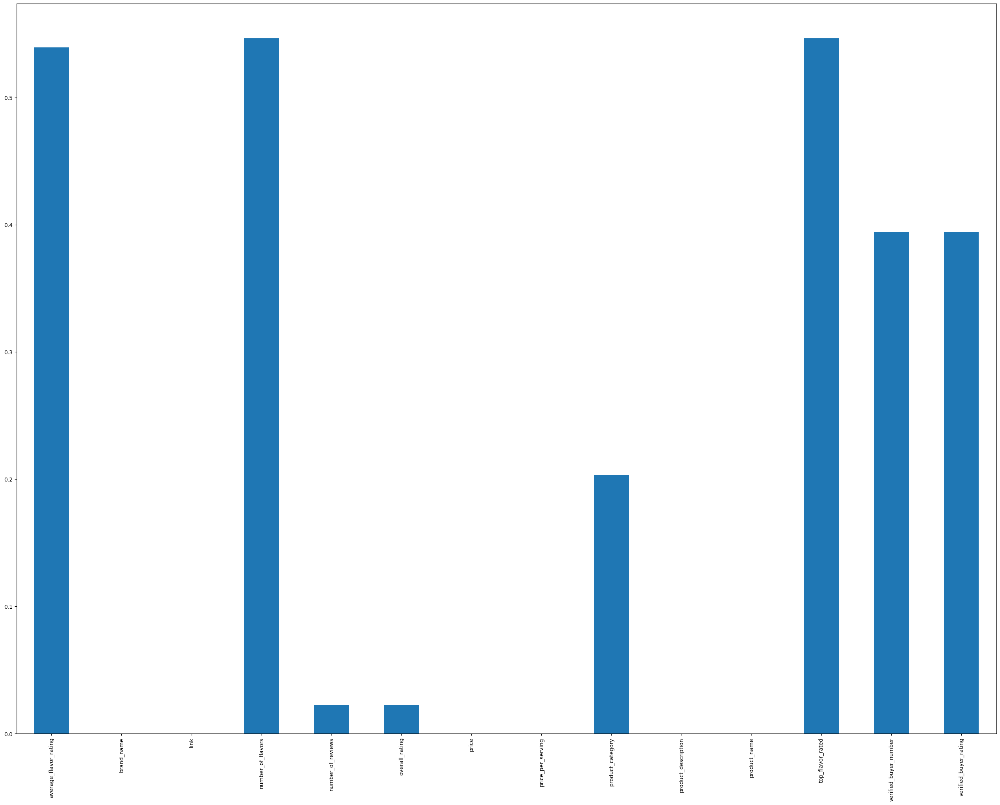

Features with Missing Data:
Index(['average_flavor_rating', 'number_of_flavors', 'number_of_reviews',
       'overall_rating', 'product_category', 'top_flavor_rated',
       'verified_buyer_number', 'verified_buyer_rating'],
      dtype='object')
Percentage of Missing Data:
average_flavor_rating    0.539286
number_of_flavors        0.546429
number_of_reviews        0.022619
overall_rating           0.022619
product_category         0.203571
top_flavor_rated         0.546429
verified_buyer_number    0.394048
verified_buyer_rating    0.394048
dtype: float64


In [13]:
import pandas as pd
import numpy as np

# Find the percentage of missing data for each column
missing_data = pandas_df.isnull().mean()

# Plot the percentage of missing data
missing_data.plot(kind='bar')
plt.show()

# Select the columns with missing data
selected_features = missing_data[missing_data > 0].index

print("Features with Missing Data:")
print(selected_features)

print("Percentage of Missing Data:")
print(missing_data[selected_features])

In [14]:
#Imputing using the Mode function for categorical data

pandas_df['product_category'] = pandas_df['product_category'].fillna(pandas_df['product_category'].mode()[0])
pandas_df['top_flavor_rated'] = pandas_df['top_flavor_rated'].fillna(pandas_df['top_flavor_rated'].mode()[0])
pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].fillna(pandas_df['verified_buyer_number'].mode()[0])


# Imputing the NULL Values in a column for using the Mean function
pandas_df['average_flavor_rating'] = pandas_df['average_flavor_rating'].fillna((pandas_df['average_flavor_rating'].mean()))
pandas_df['number_of_flavors'] = pandas_df['number_of_flavors'].fillna((pandas_df['number_of_flavors'].mean()))

#Imputing using padding

pandas_df['verified_buyer_rating'].fillna(method='pad', inplace=True)

from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=3)

# Fit and transform the data using the imputer

pandas_df['number_of_reviews'] = imputer.fit_transform(pandas_df['number_of_reviews'].values.reshape(-1, 1))
pandas_df['overall_rating'] = imputer.fit_transform(pandas_df['overall_rating'].values.reshape(-1, 1))

In [15]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

print (label_encoder)

pandas_df["brand_name"] = label_encoder.fit_transform(pandas_df["brand_name"])

pandas_df.head()

LabelEncoder()


,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.10000,26,https://sa.bodybuilding.com/store/evlution-nut...,29.000000,2575.0,9.4,19.99,0.67,BCAAs,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.40000,62,https://sa.bodybuilding.com/store/opt/whey.htm...,43.000000,9926.0,9.3,57.99,0.79,Build Muscle Products,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.30000,36,https://sa.bodybuilding.com/store/jym/pre-jym....,9.000000,3947.0,9.1,48.99,1.63,Improve Workout Products,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,8.66615,62,https://sa.bodybuilding.com/store/opt/essentia...,6.288714,2466.0,9.1,18.99,0.63,Amino Acids,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,Unflavored,1.0,9.0
4,8.70000,36,https://sa.bodybuilding.com/store/jym/pro-jym....,14.000000,2506.0,9.2,56.98,1.10,Whey Protein Isolate,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [16]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  840 non-null    float64
 1   brand_name             840 non-null    int64  
 2   link                   840 non-null    object 
 3   number_of_flavors      840 non-null    float64
 4   number_of_reviews      840 non-null    float64
 5   overall_rating         840 non-null    float64
 6   price                  840 non-null    float64
 7   price_per_serving      840 non-null    float64
 8   product_category       840 non-null    object 
 9   product_description    840 non-null    object 
 10  product_name           840 non-null    object 
 11  top_flavor_rated       840 non-null    object 
 12  verified_buyer_number  840 non-null    float64
 13  verified_buyer_rating  840 non-null    float64
dtypes: float64(8), int64(1), object(5)
memory usage: 92.0+ KB


In [17]:
#Checking for null values
pandas_df.isnull().sum().sum()

0

In [18]:
'''import pandas as pd


# perform one-hot encoding on multiple columns using get_dummies() function
#df_encoded = pd.get_dummies(pandas_df, columns=['product_category', 'product_description','product_name','top_flavor_rated'])

# print the encoded dataframe
#print(df_encoded)


import pandas as pd

# Load the CSV file into a Pandas DataFrame
pandas_df = pd.read_csv

# Select the columns to be one-hot encoded
columns_to_encode = ['product_category', 'product_description','product_name','top_flavor_rated']

# Perform one-hot encoding on the selected columns
one_hot_encoded = pd.get_dummies(pandas_df, columns=columns_to_encode)

# Save the resulting DataFrame to a new CSV file
one_hot_encoded.to_csv('one_hot_encoded_data.csv', index=False)


print(one_hot_encoded)'''

"import pandas as pd\n\n\n# perform one-hot encoding on multiple columns using get_dummies() function\n#df_encoded = pd.get_dummies(pandas_df, columns=['product_category', 'product_description','product_name','top_flavor_rated'])\n\n# print the encoded dataframe\n#print(df_encoded)\n\n\nimport pandas as pd\n\n# Load the CSV file into a Pandas DataFrame\npandas_df = pd.read_csv\n\n# Select the columns to be one-hot encoded\ncolumns_to_encode = ['product_category', 'product_description','product_name','top_flavor_rated']\n\n# Perform one-hot encoding on the selected columns\none_hot_encoded = pd.get_dummies(pandas_df, columns=columns_to_encode)\n\n# Save the resulting DataFrame to a new CSV file\none_hot_encoded.to_csv('one_hot_encoded_data.csv', index=False)\n\n\nprint(one_hot_encoded)"

In [19]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()
encoded_data = encoder.fit_transform(pandas_df[['product_category','product_name','top_flavor_rated']])

encoded_df = pd.DataFrame(encoded_data.toarray(), 
columns=encoder.get_feature_names_out(['product_category','product_name','top_flavor_rated']))

print(encoded_df)

     product_category_Acetyl L-Carnitine  product_category_Agmatine  \
0                                    0.0                        0.0   
1                                    0.0                        0.0   
2                                    0.0                        0.0   
3                                    0.0                        0.0   
4                                    0.0                        0.0   
..                                   ...                        ...   
835                                  0.0                        0.0   
836                                  0.0                        0.0   
837                                  0.0                        0.0   
838                                  0.0                        0.0   
839                                  0.0                        0.0   

     product_category_Amino Acids  product_category_Arachidonic Acid  \
0                             0.0                                0.0   
1  

In [20]:
pandas_df.describe()

,average_flavor_rating,brand_name,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,verified_buyer_number,verified_buyer_rating
count,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000
mean,8.666150,42.976190,6.288714,483.512789,8.950914,30.292274,1.033310,130.250000,7.786905
std,0.640421,24.413832,4.774815,1111.930069,0.723743,17.358937,0.862362,440.827534,2.160115
min,1.000000,0.000000,1.000000,1.000000,1.000000,2.490000,0.020000,1.000000,1.000000
25%,8.666150,24.000000,5.000000,26.000000,8.600000,17.985000,0.430000,1.000000,8.000000
50%,8.666150,48.000000,6.288714,98.000000,9.100000,27.990000,0.830000,6.000000,8.000000
75%,8.700000,62.000000,6.288714,453.250000,9.400000,37.990000,1.330000,61.750000,9.000000
max,10.000000,92.000000,43.000000,9926.000000,10.000000,119.530000,7.990000,3932.000000,9.000000


In [21]:
pandas_df['product_category'] = pd.factorize(pandas_df['product_category'])[0]

In [22]:
pandas_df.head()

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.10000,26,https://sa.bodybuilding.com/store/evlution-nut...,29.000000,2575.0,9.4,19.99,0.67,0,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.40000,62,https://sa.bodybuilding.com/store/opt/whey.htm...,43.000000,9926.0,9.3,57.99,0.79,1,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.30000,36,https://sa.bodybuilding.com/store/jym/pre-jym....,9.000000,3947.0,9.1,48.99,1.63,2,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,8.66615,62,https://sa.bodybuilding.com/store/opt/essentia...,6.288714,2466.0,9.1,18.99,0.63,3,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,Unflavored,1.0,9.0
4,8.70000,36,https://sa.bodybuilding.com/store/jym/pro-jym....,14.000000,2506.0,9.2,56.98,1.10,4,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [23]:
#pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].str.replace('Flavors','')

In [24]:
pandas_df.tail(20)

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
820,8.66615,75,https://sa.bodybuilding.com/store/san/free-t.h...,6.288714,2.000000,9.500000,29.56,0.99,11,Safe & Effective!,FREE-T,Unflavored,2.0,9.0
821,8.66615,76,https://sa.bodybuilding.com/store/snac/hypoxyg...,6.288714,4.000000,9.900000,41.60,0.92,64,Performance - Recovery & Overall Health!*,HypOxygen,Unflavored,1.0,9.0
822,10.00000,70,https://sa.bodybuilding.com/store/redcon1/tang...,6.288714,3.000000,10.000000,34.99,1.17,7,Creatine Powder For Aiding In Muscular Strength*,Tango,Unflavored,2.0,1.0
823,9.90000,57,https://sa.bodybuilding.com/store/nutrabio/bet...,1.000000,4.000000,10.000000,33.59,0.19,7,Patented Carnosyn Beta Alanine To Improve Musc...,Beta Alanine,Unflavored,1.0,1.0
824,9.20000,18,https://sa.bodybuilding.com/store/cellucor/c4-...,10.000000,92.000000,9.400000,16.99,4.25,14,"Pre-Mix Pre-Workout for Energy, Focus and Ulti...",C4 On The Go,Sparkling Frozen Bombsicle,7.0,9.0
825,9.30000,5,https://sa.bodybuilding.com/store/ascent/nativ...,4.000000,24.000000,9.600000,75.80,1.40,4,Made with Zero Artificial Ingredients and Nati...,Native Fuel Whey Protein,Cappuccino,18.0,9.0
826,7.70000,35,https://sa.bodybuilding.com/store/nb/naturalis...,2.000000,30.000000,8.400000,41.07,1.87,4,Natural!,Natural Isopure,Baunilha natural,5.0,8.0
827,9.30000,51,https://sa.bodybuilding.com/store/muscletech/1...,2.000000,76.000000,9.700000,79.99,1.19,7,25G Of Protein With 5.6G Bcaas In Every Scoop ...,100% Whey Protein + Isolate,French Vanilla,2.0,1.0
828,8.66615,50,https://sa.bodybuilding.com/store/musclepharm/...,6.288714,298.000000,9.000000,20.29,0.75,1,25G Fast Digesting Protein,Combat 100% Whey,Unflavored,1.0,1.0
829,8.66615,50,https://sa.bodybuilding.com/store/musclepharm/...,6.288714,403.000000,9.000000,18.95,0.32,0,Amino Acid Capsule or Powder for Muscle Develo...,BCAA,Unflavored,1.0,1.0


#Fitting a Linear Model

In [25]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

In [26]:
X = pandas_df.drop(["price_per_serving","link","product_description","top_flavor_rated","product_category","product_name"], axis=1)  # Training Feature
Y = pandas_df["price_per_serving"]  # Target

In [27]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process'''

In [28]:
X.columns

Index(['average_flavor_rating', 'brand_name', 'number_of_flavors',
       'number_of_reviews', 'overall_rating', 'price', 'verified_buyer_number',
       'verified_buyer_rating'],
      dtype='object')

In [29]:
print(pandas_df['number_of_flavors'].dtype)

float64


In [30]:
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [31]:
pandas_df.head()

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.10000,26,https://sa.bodybuilding.com/store/evlution-nut...,29.000000,2575.0,9.4,19.99,0.67,0,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.40000,62,https://sa.bodybuilding.com/store/opt/whey.htm...,43.000000,9926.0,9.3,57.99,0.79,1,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.30000,36,https://sa.bodybuilding.com/store/jym/pre-jym....,9.000000,3947.0,9.1,48.99,1.63,2,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,8.66615,62,https://sa.bodybuilding.com/store/opt/essentia...,6.288714,2466.0,9.1,18.99,0.63,3,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,Unflavored,1.0,9.0
4,8.70000,36,https://sa.bodybuilding.com/store/jym/pro-jym....,14.000000,2506.0,9.2,56.98,1.10,4,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [32]:
# OLS model Library
import statsmodels.formula.api as smf
results = smf.ols("price_per_serving ~ average_flavor_rating + brand_name + number_of_flavors + number_of_reviews + overall_rating + price + verified_buyer_rating",data=pandas_df).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      price_per_serving   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     22.22
Date:                Wed, 29 Mar 2023   Prob (F-statistic):           1.19e-27
Time:                        23:51:45   Log-Likelihood:                -995.04
No. Observations:                 840   AIC:                             2006.
Df Residuals:                     832   BIC:                             2044.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 1.1437      0.438      2.611      0.009       0.284       2.003
average_flavor_rating    -0.0711      0.049     -1.438      0.151      -0.168       0.026
brand_name               -0.0017      0.001     -1.491      0.136      -0.004       0.001
number_of_flavors         0.0075      0.008      1.003      0.316      -0.007       0.022
number_of_reviews     -5.807e-05   3.22e-05     -1.802      0.072      -0.000    5.18e-06
overall_rating            0.0122      0.044      0.278      0.781      -0.074       0.098
price                     0.0188      0.002     11.667      0.000       0.016       0.022
verified_buyer_rating    -0.0152      0.013     -1.179      0.239      -0.041       0.010
==============================================================================
Omnibus:                      462.046   Durbin-Watson:                   1.927
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4969.571
Skew:                           2.281   Prob(JB):                         0.00
Kurtosis:                      14.008   Cond. No.                     1.94e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.94e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#Interpreting Regression Co-efficients
**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target *increases* if the value of co-efficient *increases* and vice-versa. Whereas the negative values indicates that the value of target *increases* if the value of co-efficient *decreases* and vice versa.

As seen in the co-efficient coloumn in the above table
- Value for the variable price is highest = 0.0188
- Followed by overall rating = 0.0122

High absolute values of co-efficients can be used to get an idea of the importance of variables in a linear regression. Here, as stated above price and overall rating seems to be the most important variables to predict target i.e. Price per Serving.

Also, it signifies that Higher the price of serving and overall rating - better is the quality of supplement.

**P-Values**

If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant
- average_flavor_rating	
- brand_name
- number_of_reviews
- verified_buyer_rating


These variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target (Price_Per_Serving).

**Skew and Kurtosis**

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 2.281, 14.008 respectively.

**Durbin-Watson**

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.
- Value of 2 indicates that no auto correlation is detected
- Value between 0 to 2 indicates that there is positive auto correlation detected
- Value between 2 to 4 indicates that there is negatibe auto correlation detected

Our model has a DW score of 1.927 which could be interpreted as a positive auto-correlation in the residuals of regression. 

**Jarque-Bera Test**

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 4969.571 which again re-inforces the interpretation we got from Skew and Kurtosis. 

#Fit Tree Based Model

In [33]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

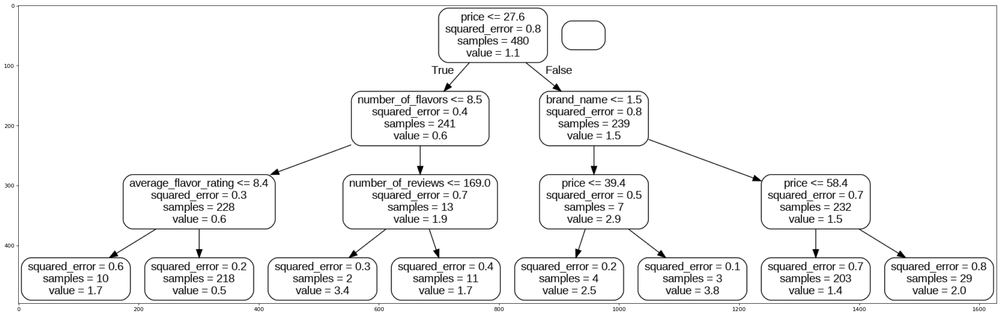

In [34]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

# Interpreting Nodes of a Tree-Based Model

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its *final* output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.

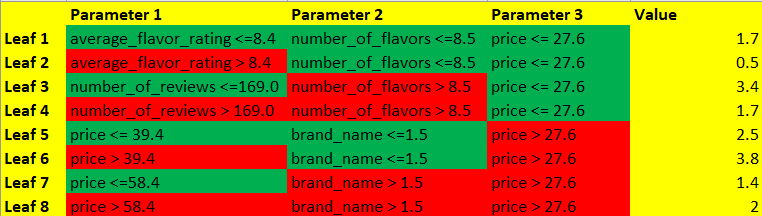
Please refer to the above figure to understand the nodes
The first leaf gets gains from all parameters as the condition satisfied for all 3 parameters
The second leaf gets gains from parameters 2, and 3 but not from parameters 1
And Similarly, the red marked cells are the losses incurred and Green marked cells are the gains incurred from the parameters which give us output as values for this specific decision tree




In [35]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [36]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: price                Importance: 0.63
Variable: number_of_flavors    Importance: 0.19
Variable: number_of_reviews    Importance: 0.07
Variable: verified_buyer_number Importance: 0.05
Variable: brand_name           Importance: 0.03
Variable: average_flavor_rating Importance: 0.02
Variable: overall_rating       Importance: 0.0
Variable: verified_buyer_rating Importance: 0.0


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

#Getting best model using H2O AutoML

In [37]:
pandas_hf = h2o.H2OFrame(pandas_df)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [38]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = pandas_hf.split_frame([pct_rows])

In [39]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "price_per_serving"

    X.remove(y)  # Removing the result frm our predictors data
    X.remove("link")  # Removing link from the predictor's data, as it is not related

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [40]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [41]:
autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_235153,0.582542,0.339355,0.38089,0.233126,0.339355
StackedEnsemble_AllModels_2_AutoML_1_20230329_235153,0.596322,0.355599,0.389365,0.235331,0.355599
StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_235153,0.599428,0.359314,0.38999,0.236331,0.359314
StackedEnsemble_AllModels_3_AutoML_1_20230329_235153,0.602741,0.363296,0.388745,0.238781,0.363296
StackedEnsemble_AllModels_1_AutoML_1_20230329_235153,0.603408,0.364101,0.392545,0.238546,0.364101
StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_235153,0.606998,0.368446,0.40022,0.240512,0.368446
StackedEnsemble_BestOfFamily_1_AutoML_1_20230329_235153,0.618809,0.382925,0.404817,0.246263,0.382925
XGBoost_grid_1_AutoML_1_20230329_235153_model_2,0.621559,0.386336,0.413323,0.253394,0.386336
XGBoost_grid_1_AutoML_1_20230329_235153_model_24,0.641331,0.411306,0.430606,0.261105,0.411306
XGBoost_grid_1_AutoML_1_20230329_235153_model_13,0.64266,0.413012,0.429793,0.26528,0.413012


In [42]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

7
Model Details
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_1_20230329_235153_model_2


Model Summary: 
    number_of_trees
--  -----------------
    43

ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 0.03064386527926583
RMSE: 0.1750538924996123
MAE: 0.08272758758844964
RMSLE: 0.05476853975377876
Mean Residual Deviance: 0.03064386527926583

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 0.3863362009583366
RMSE: 0.6215594910853961
MAE: 0.41332329140869084
RMSLE: 0.2533937813656507
Mean Residual Deviance: 0.3863362009583366

Cross-Validation Metrics Summary: 
                        mean      sd         cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ---------  ------------  ------------  ------------  ------------  ------------
mae                     0.413299  0.0397535  0.457014      0.353298      0.430045      0.429342      0.396795
mean_residual_deviance  0.38

In [43]:
autoML_model.predict

<bound method ModelBase.predict of H2OXGBoostEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'XGBoost_grid_1_AutoML_1_20230329_235153_model_2', 'type': 'Key<Model>', 'URL': '/3/Models/XGBoost_grid_1_AutoML_1_20230329_235153_model_2'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Frame>

#SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

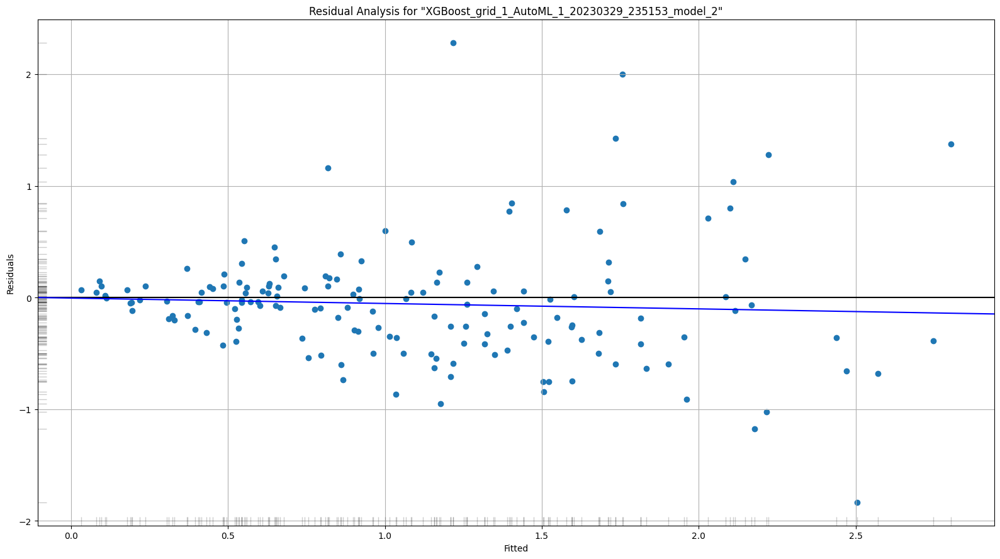

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

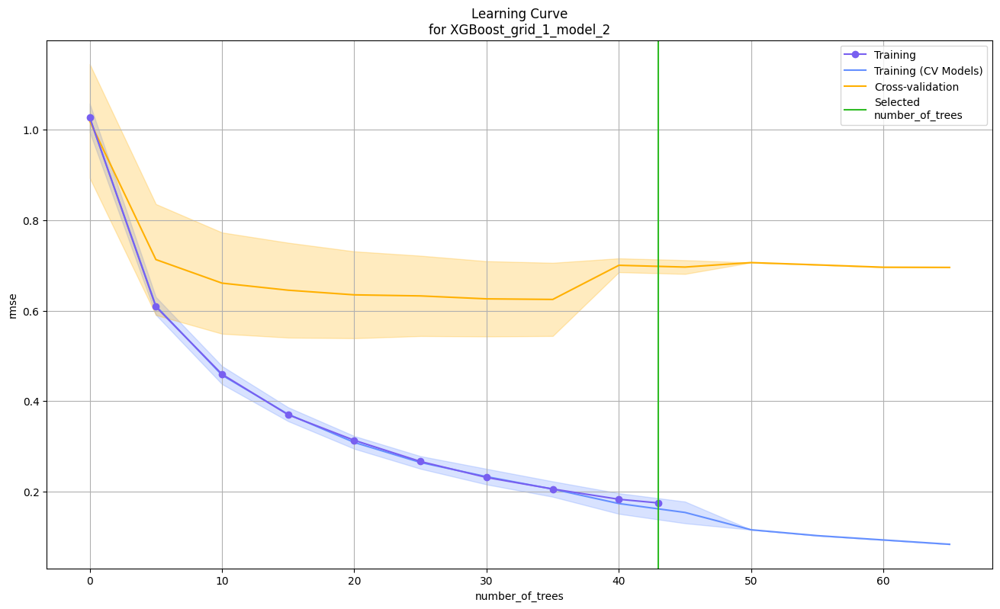

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

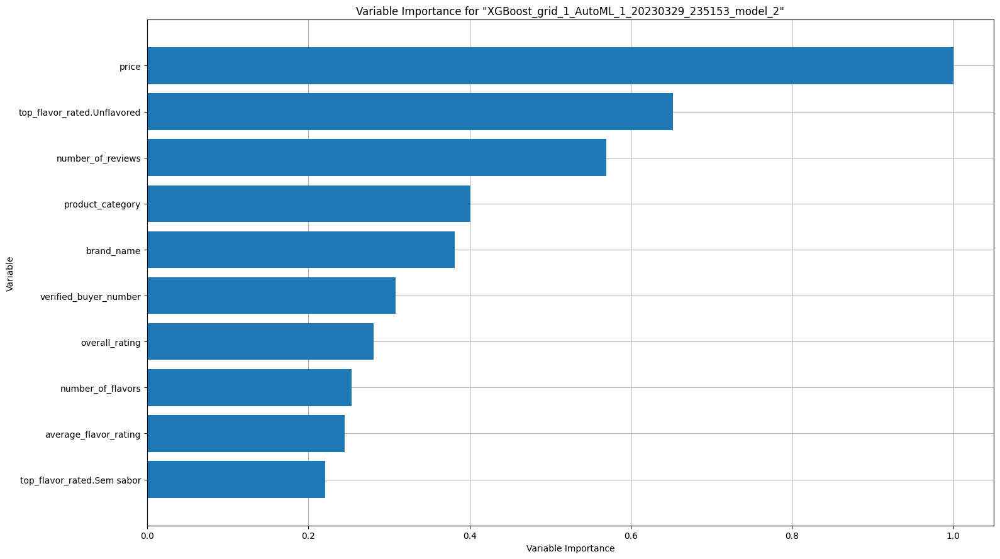

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

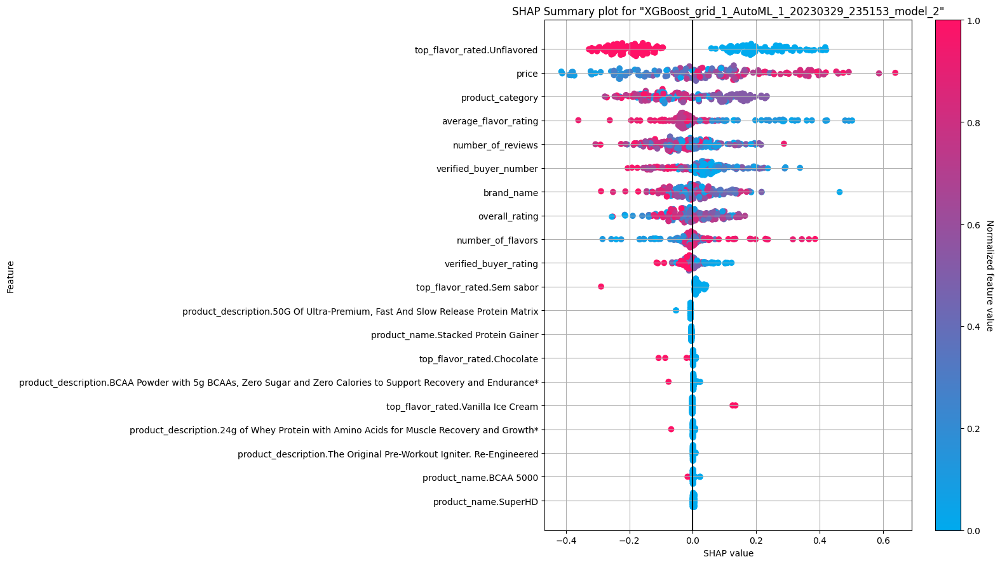

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

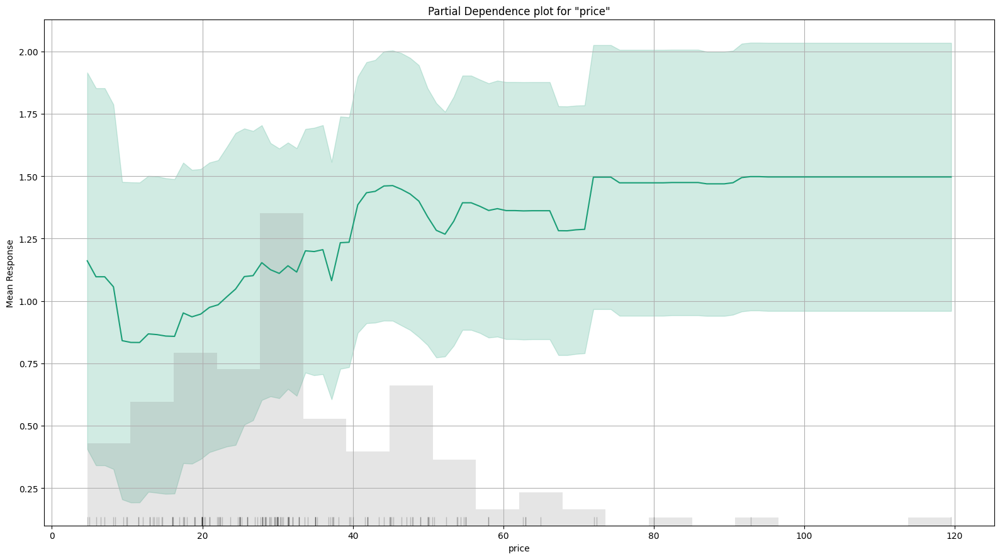

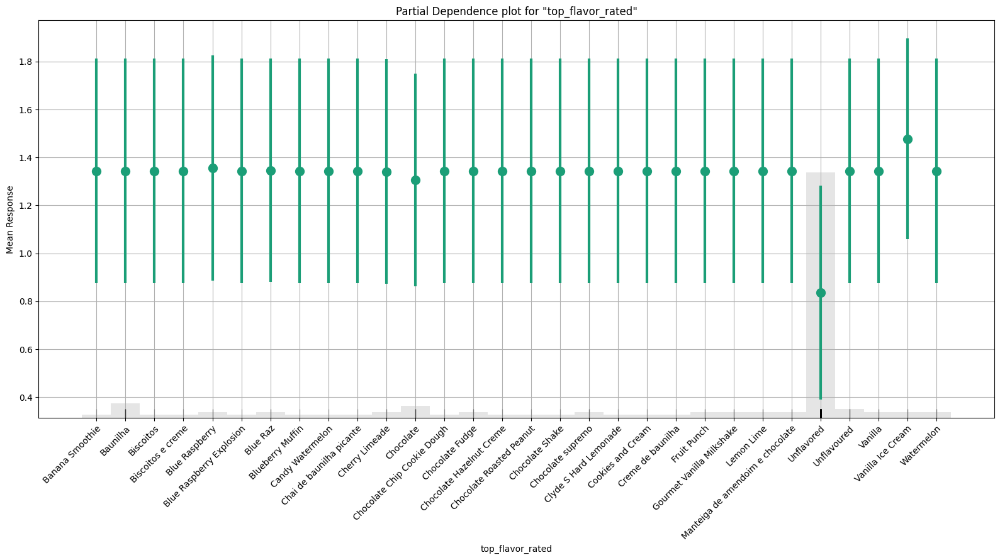

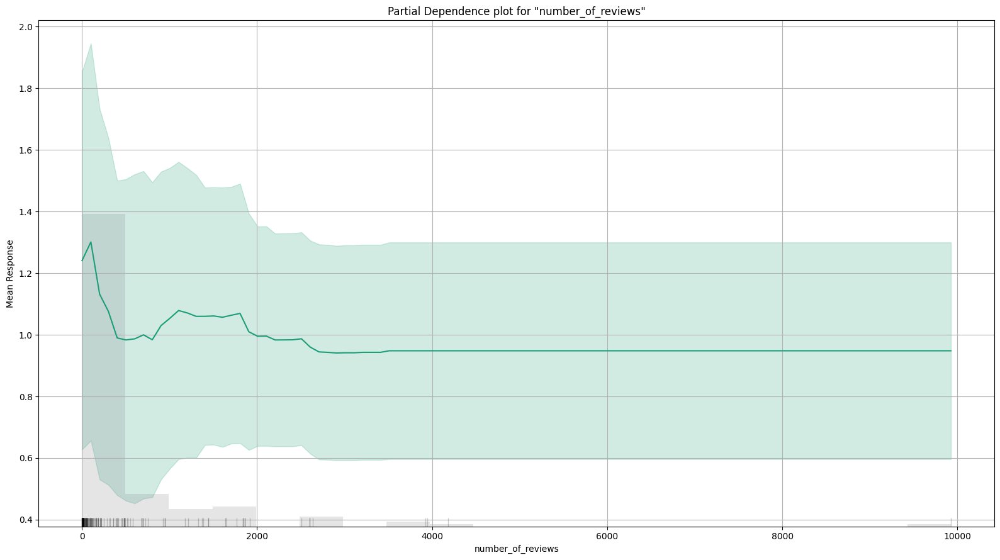

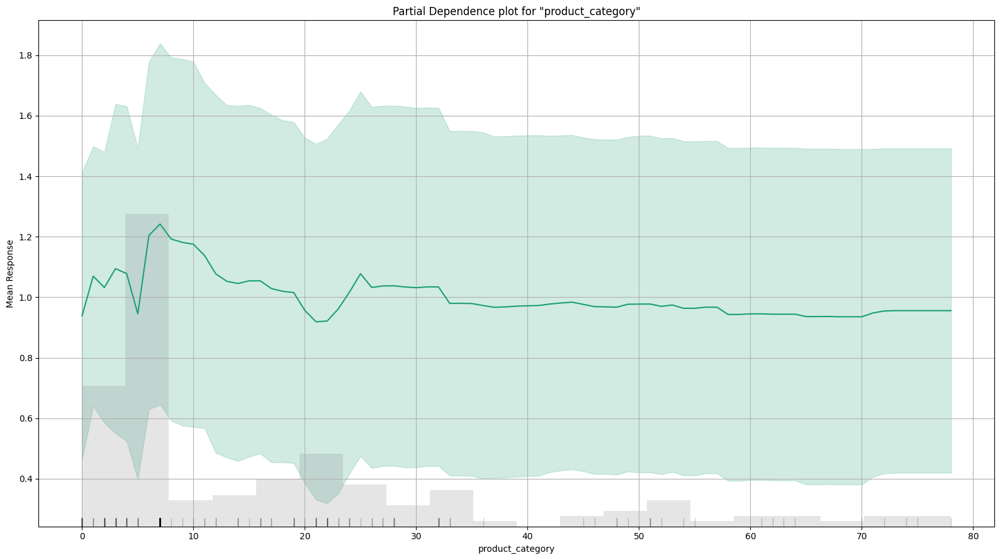

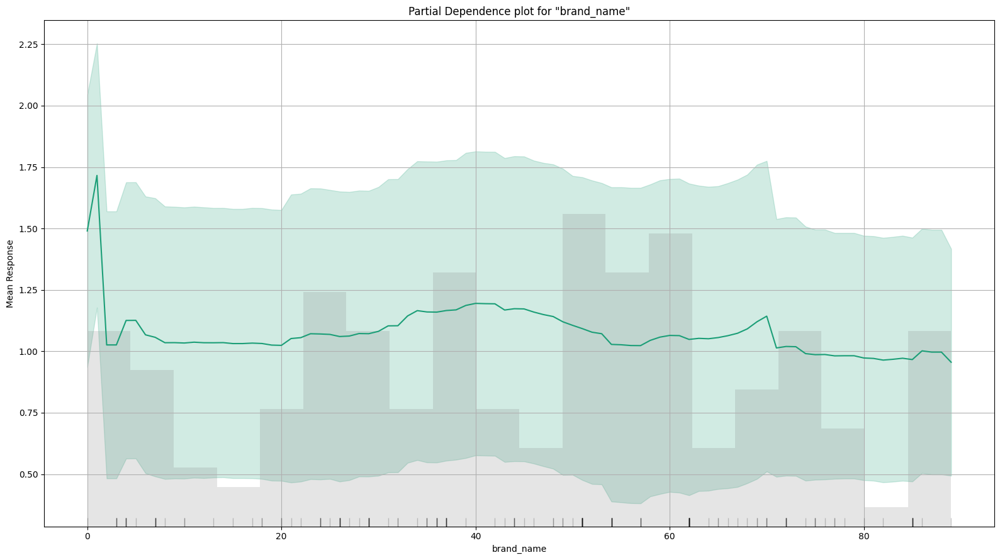

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

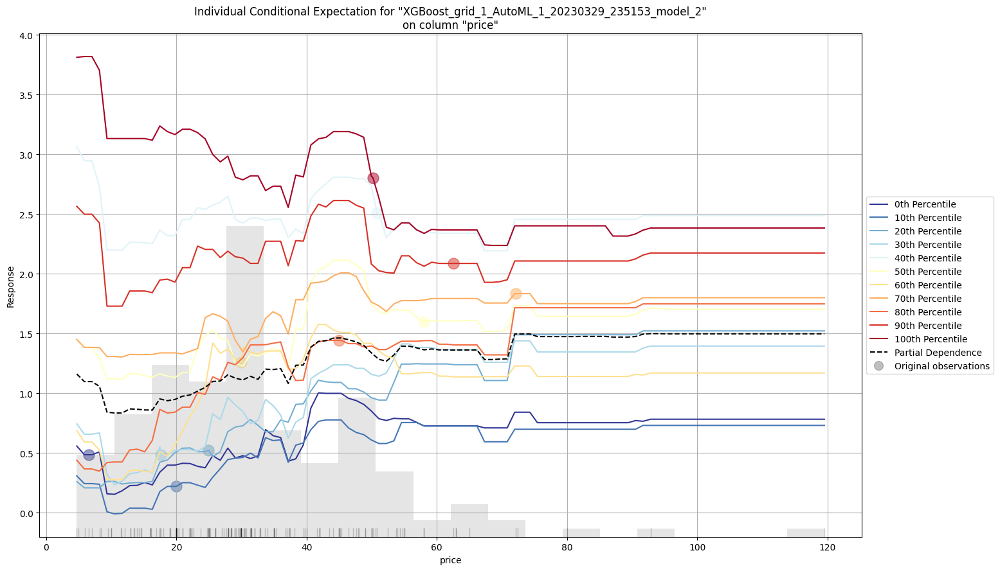

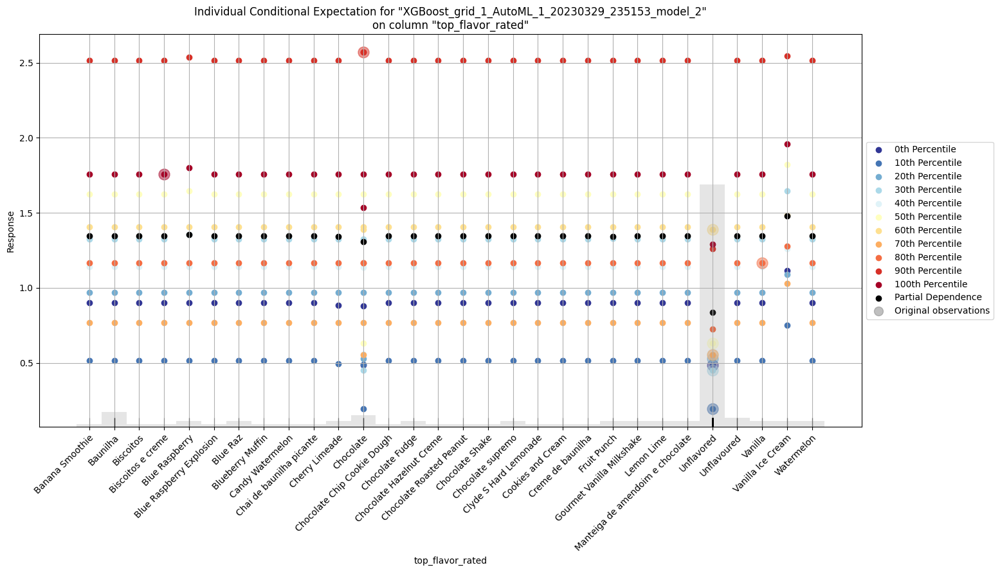

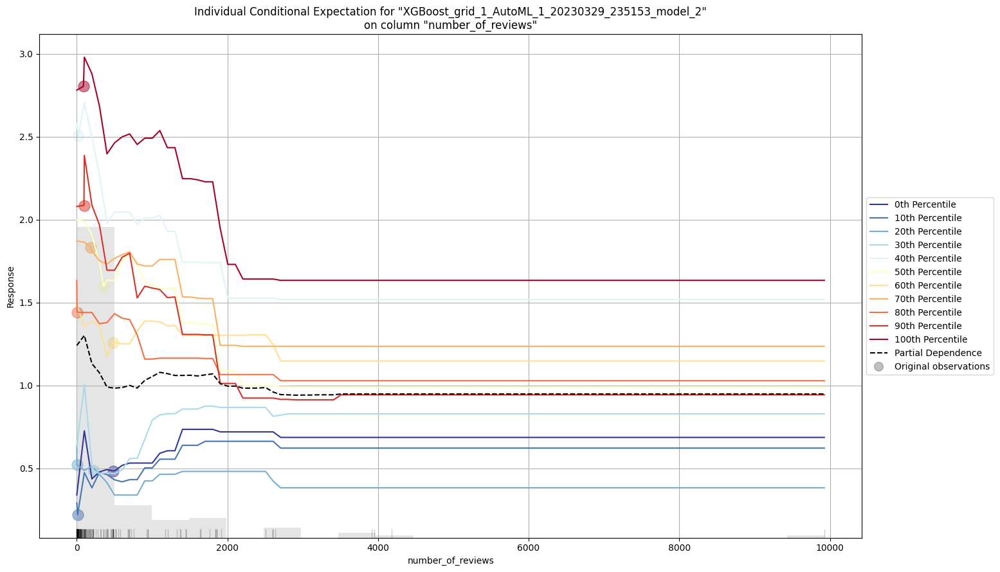

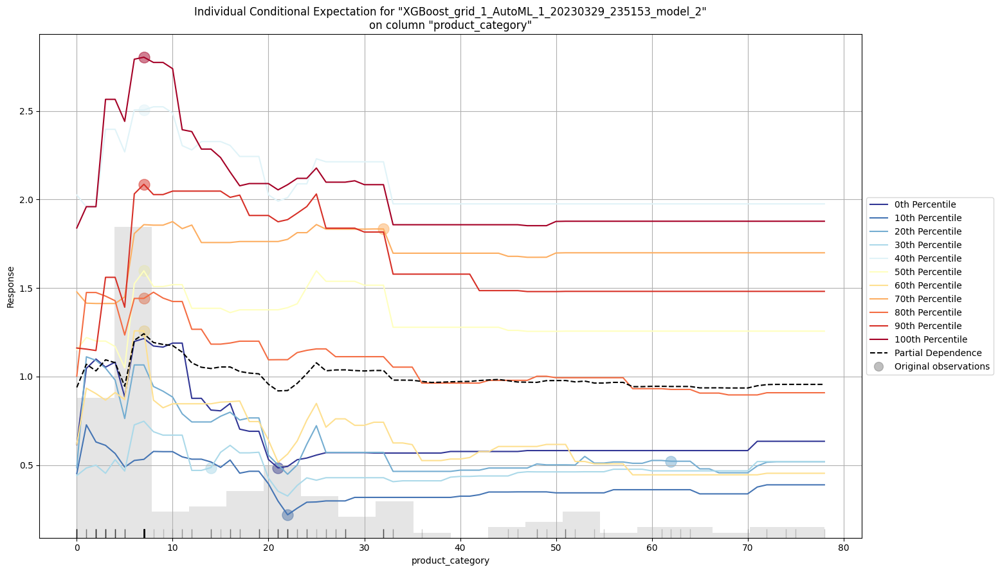

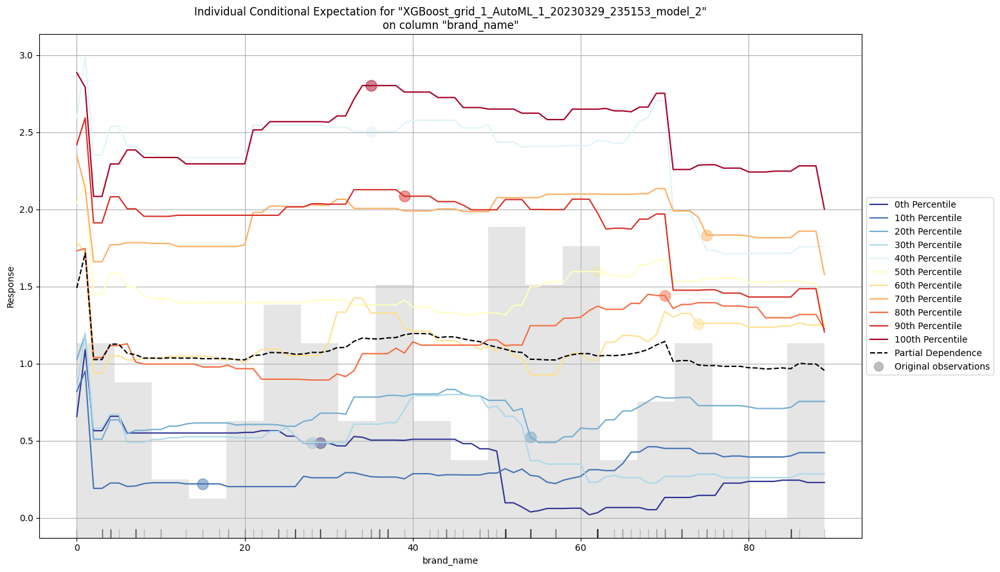

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [44]:
autoML_model.explain(autoML[1])  # AutoML Explainability

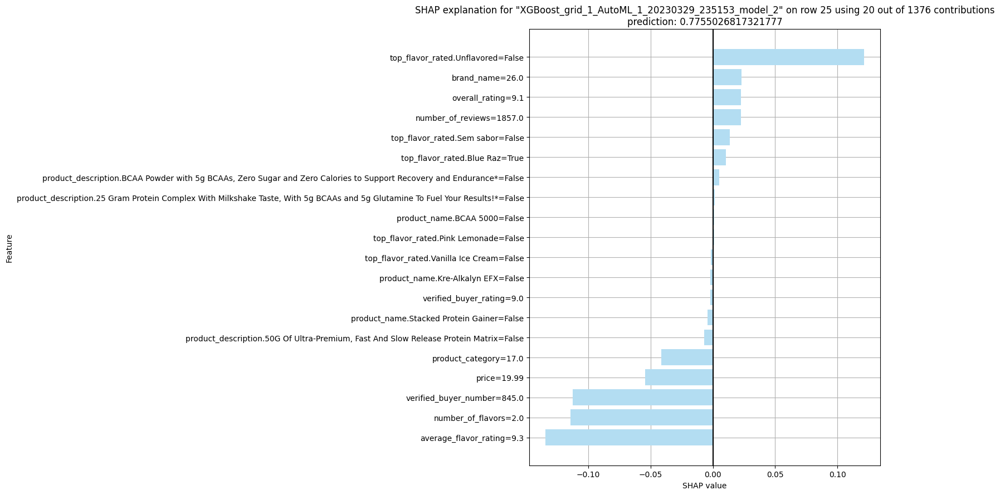

In [45]:
autoML_model.shap_explain_row_plot(
    autoML[1], 25
)  # Lets Analyze the 25th row in Test Data

#Interpreting Best Model from AutoML

## Residual Analysis
- Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

## Variable Importance
- In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding

## SHAP Summary
From the SHAP summary diagram, we can interpret a few conclusions - 

1.   All the features are listed as per their importance in making the prediction, that is price is more significant followed by overall_rating, and so on. Hence, average_flavor_rating is the least significant predictor in our model.
2.   The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see Price has the most impact on the price per serving. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. i.e. - High price results in high price per serving, followed by top flavor of supplement and so on. As we can see the distribution of red points in the price feature is far more spread than the blue points. From this visual, we can interpret that the price per serving vastly increases as the price increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated. Let us analyze the distribution of SHAP values of this feature. As seen in the SHAP plot we can see that extreme values on both ends can have a significant effect on the price per serving. 


The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.

## Partial Dependence Plot (PDP)

A partial dependence plot shows the marginal effect of a feature on the target(price per serving in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

For Interpretation purposes, let us pick up the two most important variables - Price and Overall Rating. 

1.   As we can see that when the rest of the variables are kept constant and a 
marginal change is made in price, we can see the mean response increases between price levels of 20 and 50. This could be interpreted as this range of price could be the deciding factor in the price per serving.
2.   Similarly when the rest of the variables are kept constant and a marginal change is made in average flavor rating we can observe the mean response of quality going up between the overall rating range of 10 to 20. Hence, it can be interpreted that this range is deciding factor in the quality of the price per serving. 

The computation of partial dependence plots is intuitive: The partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.

## ICE (Individual Conditional Expectation) Plot

ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value. 

Let us go back to theprice and aerage flavor rated, as we interpreted in PDP the price per serving increases when price is between 40 to 60 . But is this true for every prodduct in the dataset? ICE plot has an answer to this question. As we can see in the ICE plot above the quality of a few products(0th percentile instance) increases a lot in this range while the price of a few doesn't change much(100th Percentile Instance). 

Individual conditional expectation curves are even more intuitive to understand than partial dependence plots. One line represents the predictions for one instance if we vary the feature of interest.

## SHAP explanation for an Individual Price per serving
Analyzing the 25th price in the dataset, please refer to the above cell for the Graph Y-axis has the features with its values from the 25th price per serving and X-axis has its corresponding SHAP values. This graph shows the contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying the inverse link function.




#SHAP Analysis for Linear and Tree-Based Models

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of average_flavor_rating
- For the linear model the cross is made at approx  E[f(x)] 1.02
- For Tree-based model the cross is made at approx E[f(x)] 1.06

So as the average_flavor_rating increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value. 

In [46]:
#x_train['verified_buyer_number'] = x_train['verified_buyer_number'].astype(float)

In [47]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 756 entries, 482 to 102
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  756 non-null    float64
 1   brand_name             756 non-null    int64  
 2   number_of_flavors      756 non-null    float64
 3   number_of_reviews      756 non-null    float64
 4   overall_rating         756 non-null    float64
 5   price                  756 non-null    float64
 6   verified_buyer_number  756 non-null    float64
 7   verified_buyer_rating  756 non-null    float64
dtypes: float64(7), int64(1)
memory usage: 53.2 KB


Exact explainer: 757it [00:11,  5.59it/s]


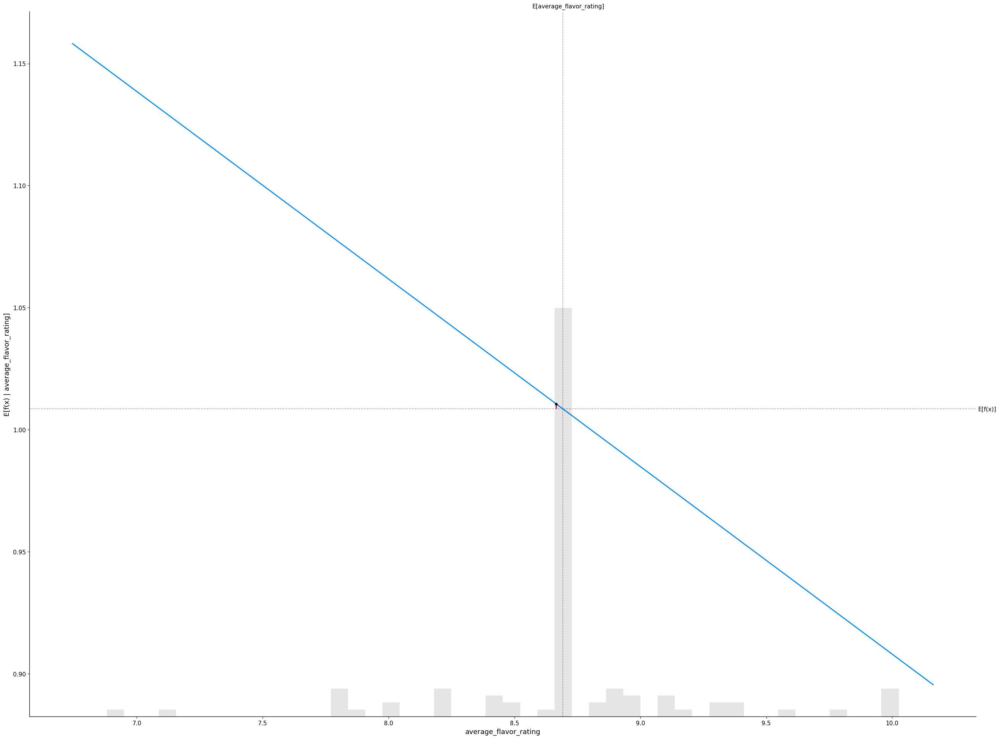

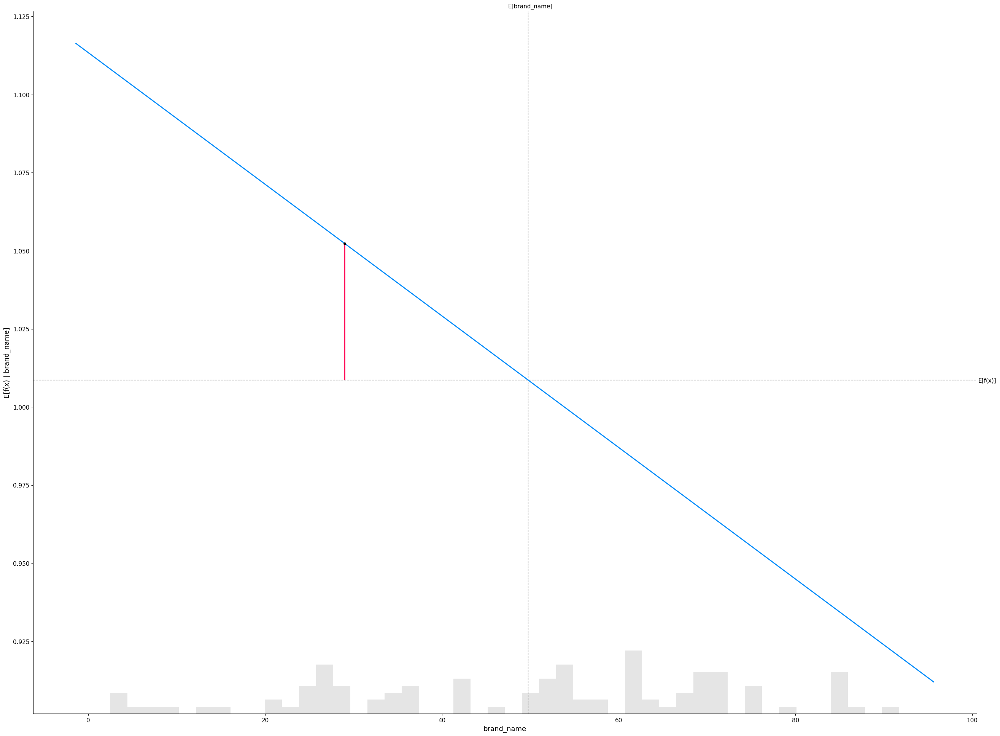

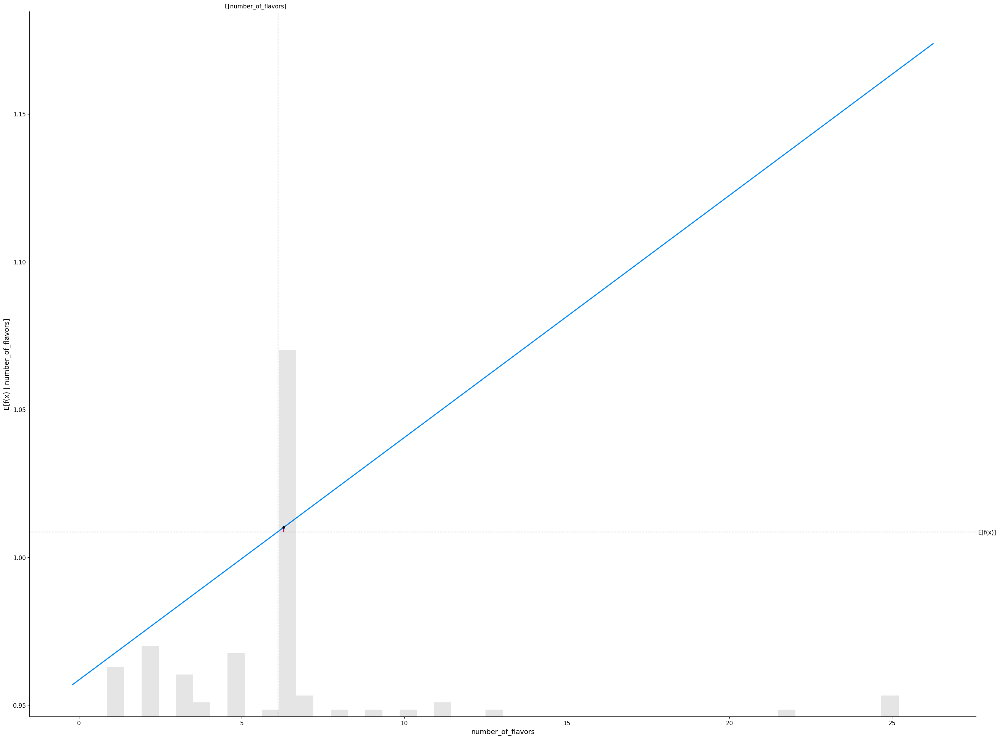

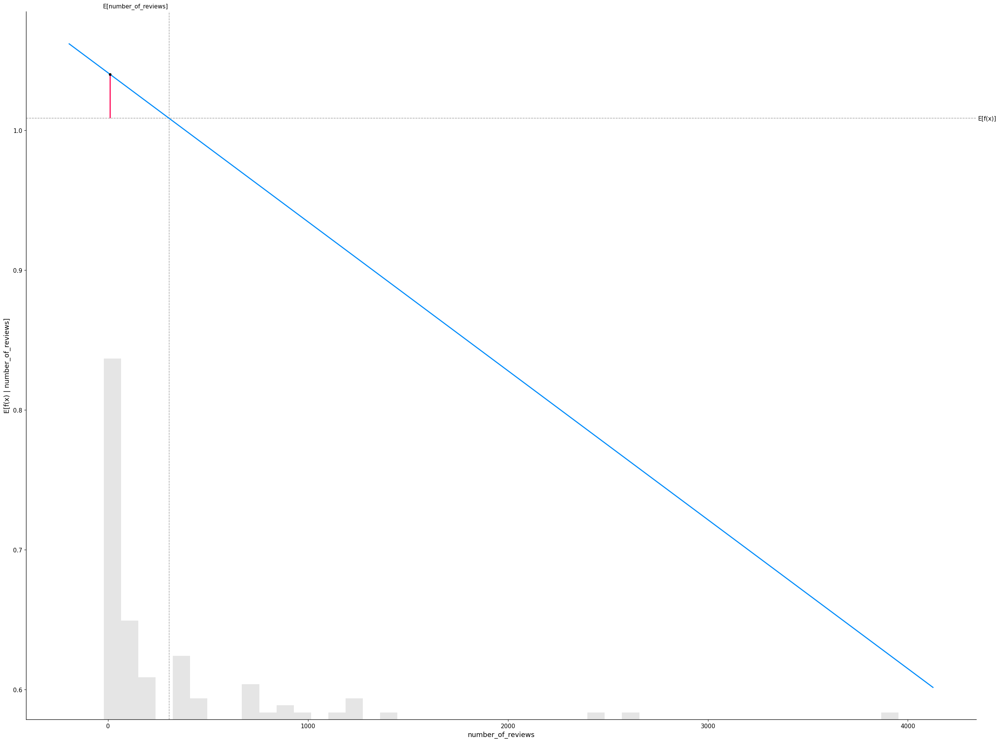

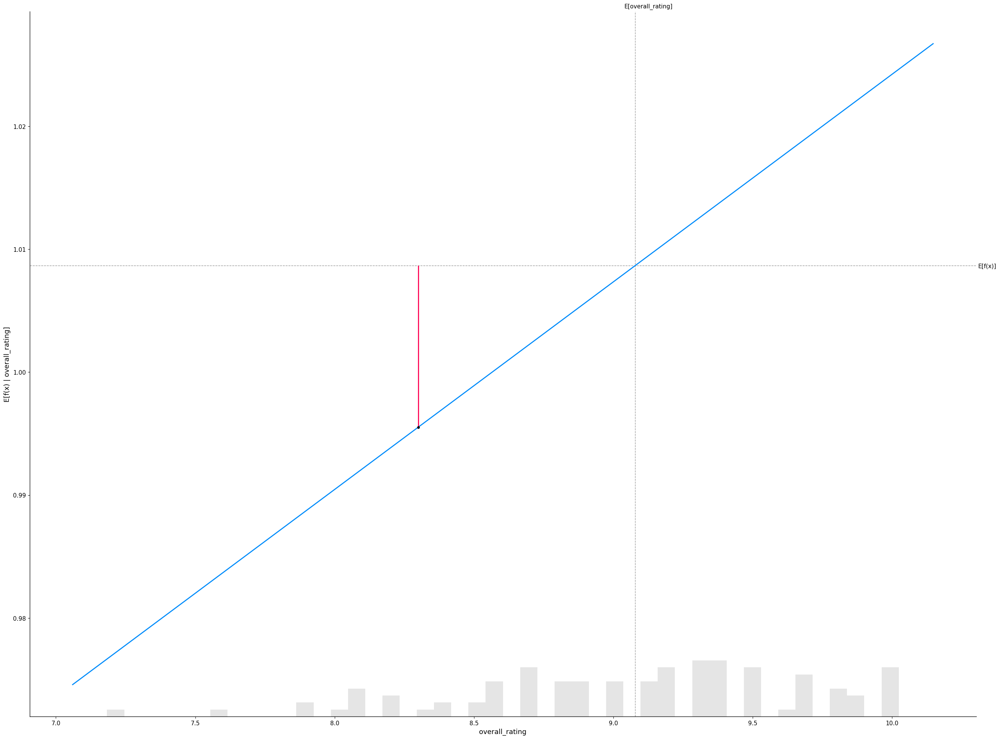

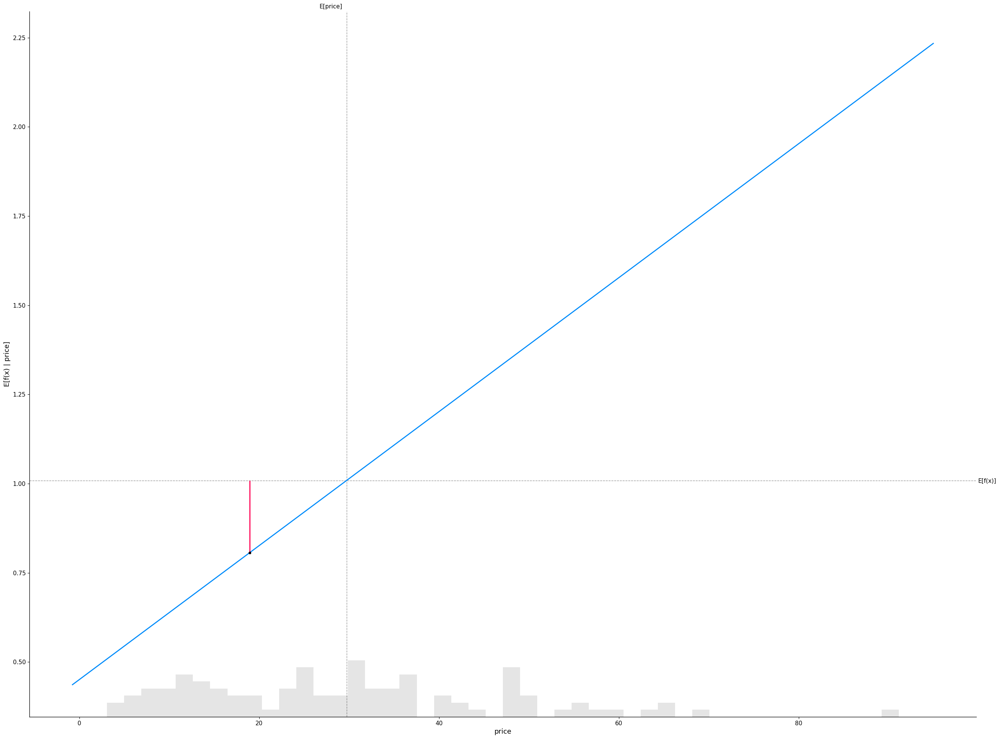

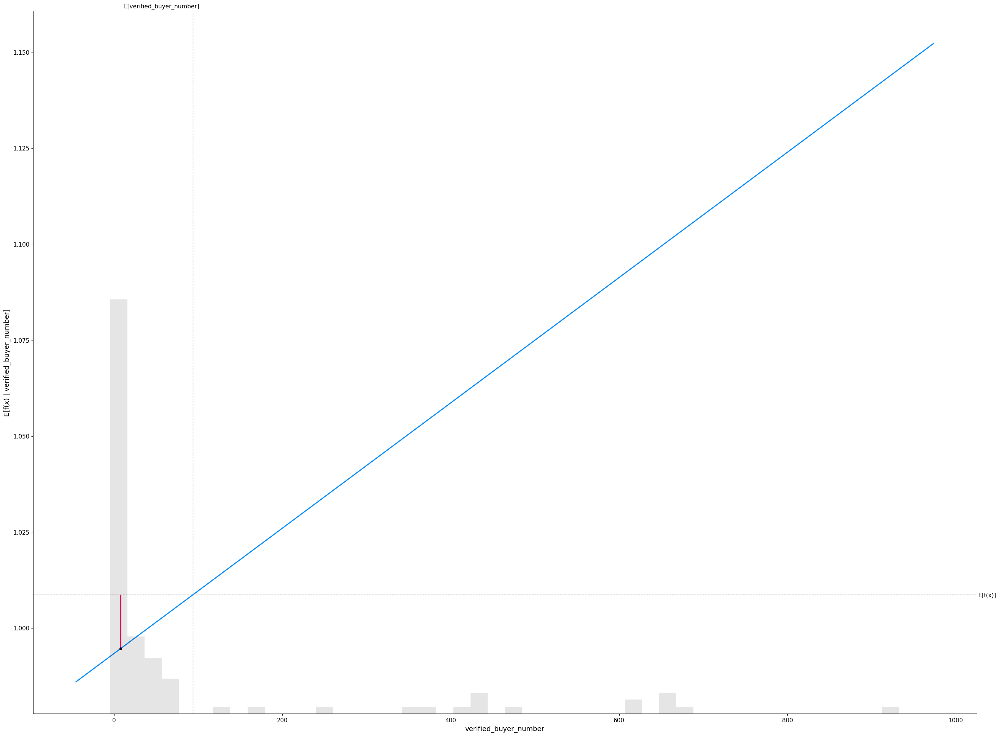

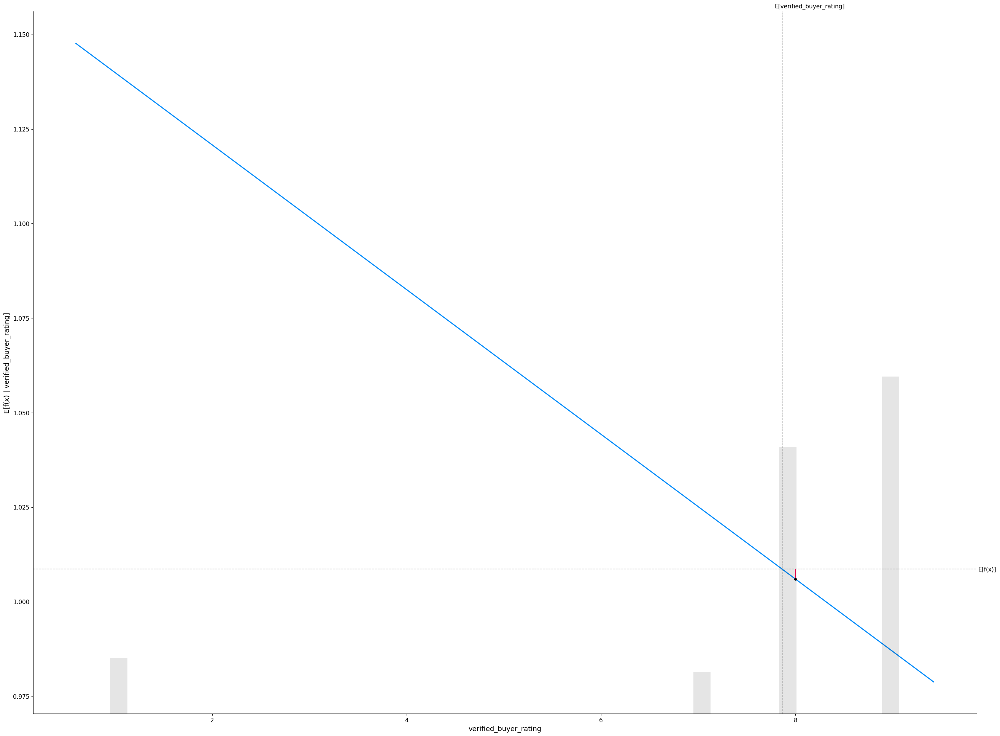

In [48]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )



SHAP Values - Tree Based Model

Exact explainer: 757it [00:10,  2.98it/s]                         


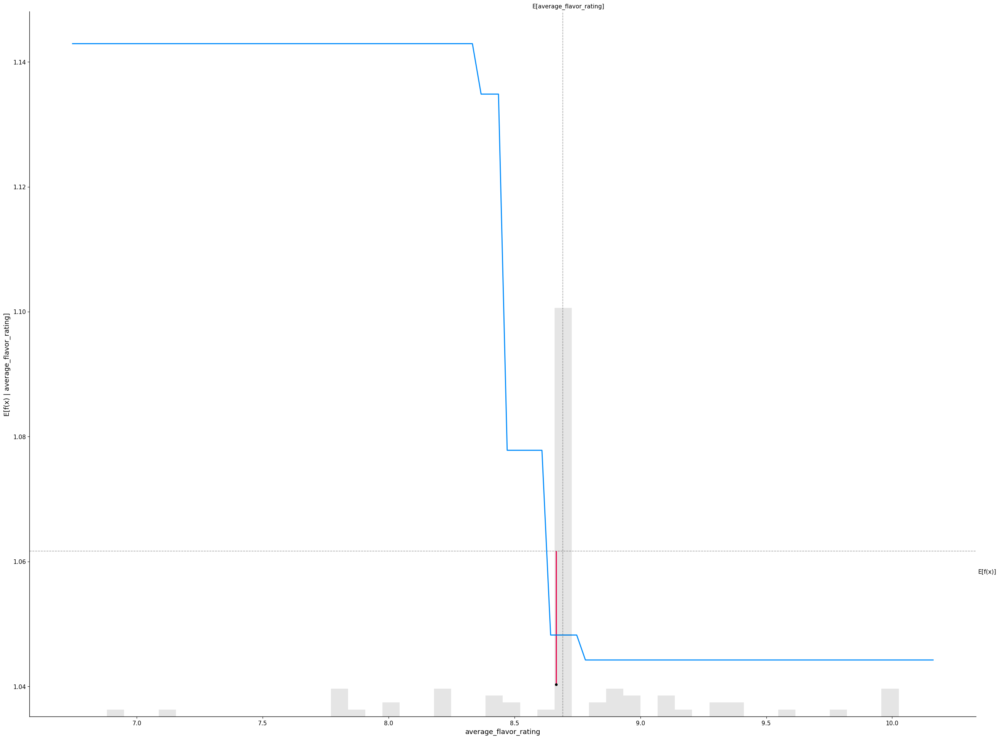

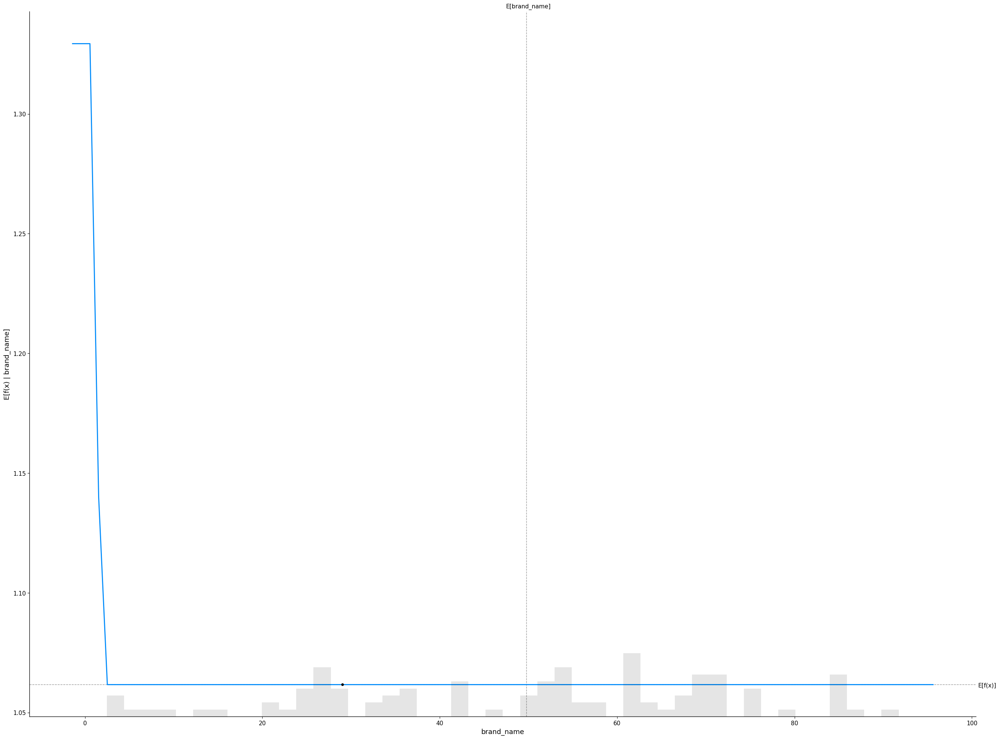

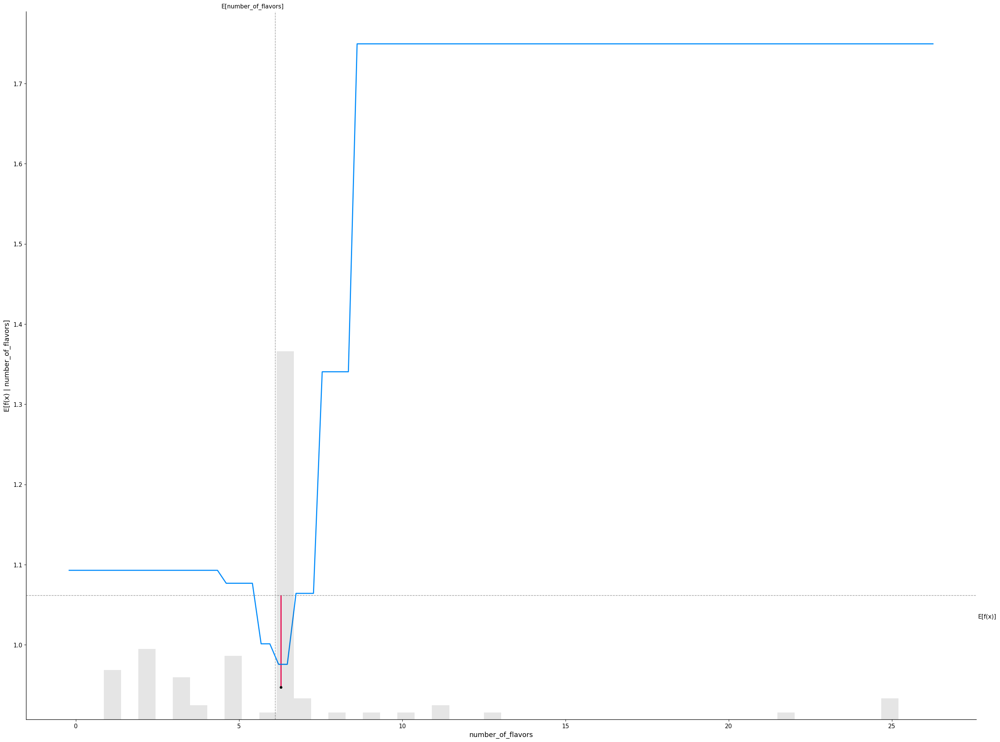

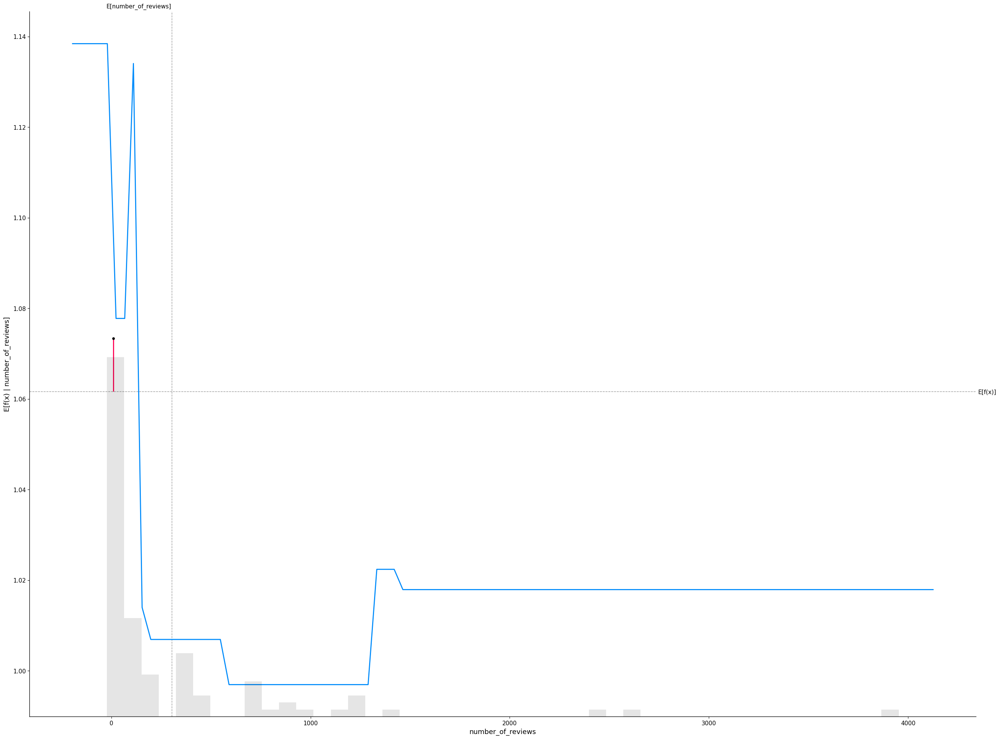

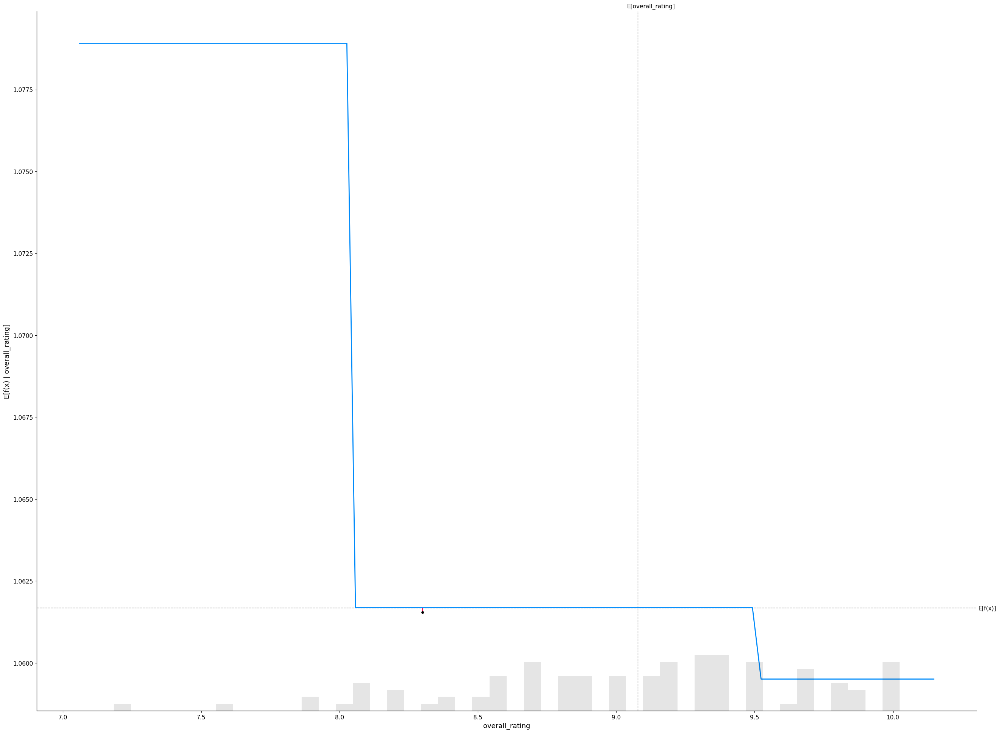

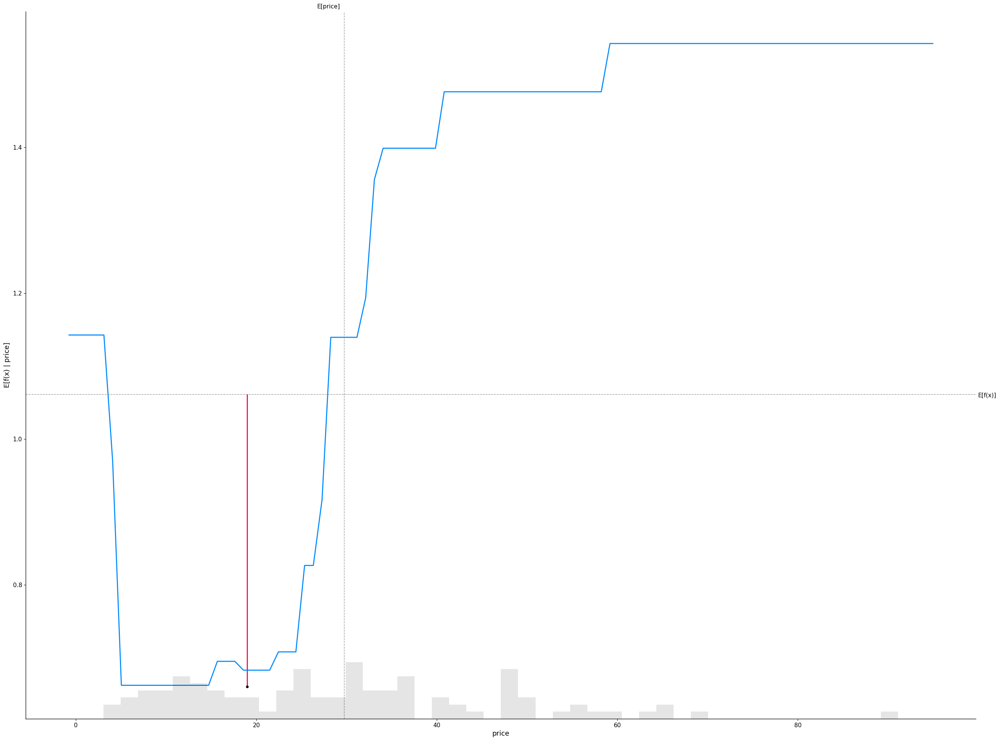

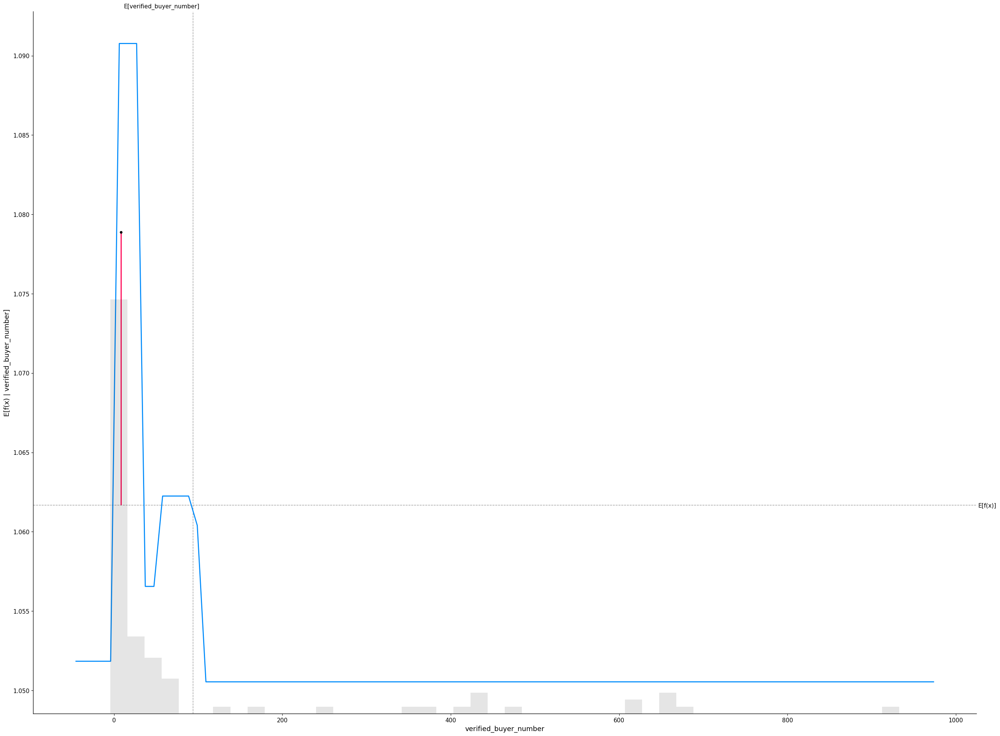

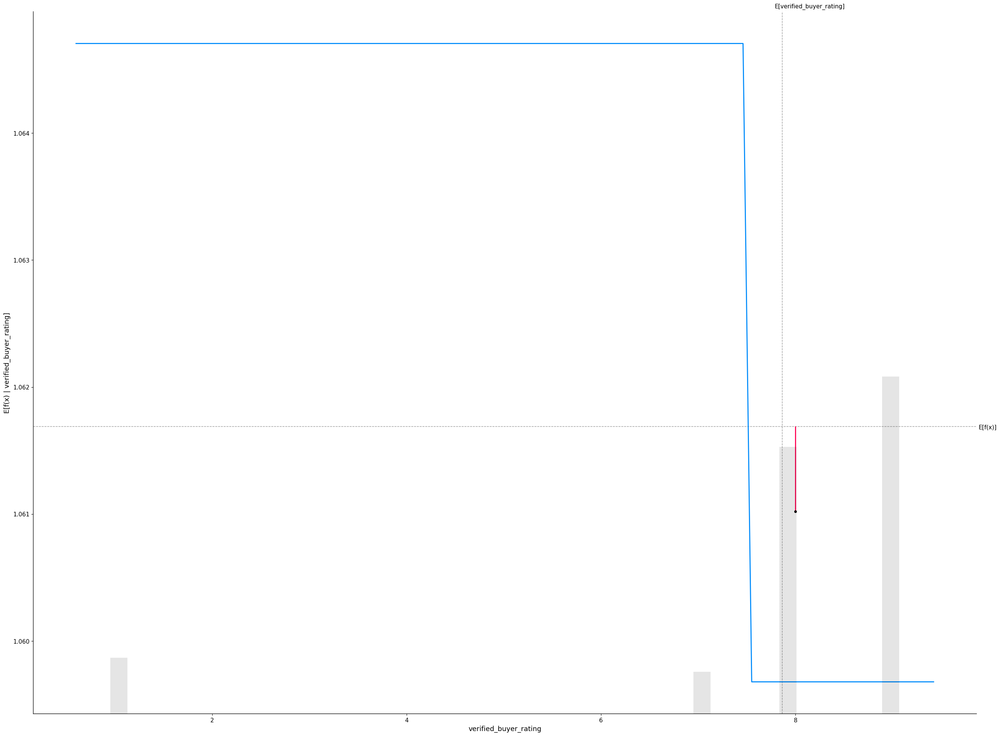

In [49]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

#Interpreting SHAP Feature Importance Plot for Linear and Tree-based model
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are 

1.   SHAP feature importance for a linear model
2.   SHAP feature importance for tree-based model

As we can see below in the plots, there is a difference in feature importance for both the models
- For the linear model, number_of_reviews is the second most important feature but for our tree-based model number_of_flavors is the second most important feature when we consider the average of SHAP values to calculate feature importance.




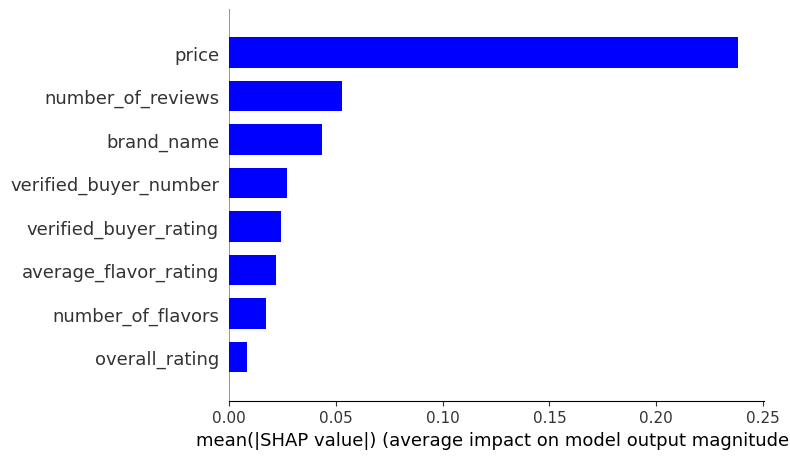

In [50]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

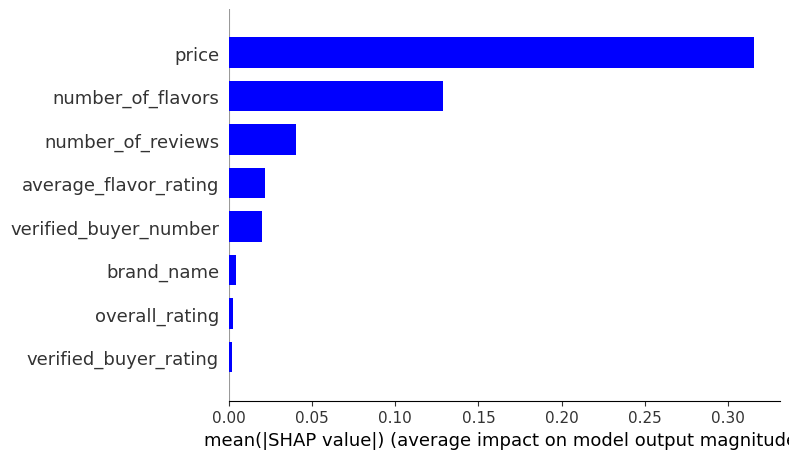

In [51]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

#Interpreting Waterfall SHAP visualization

1. Let's consider the same sample (sample_ind = 18)
Notice the value of price in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that **f(x) = 0.85 is what we got as a model output** and the **expected output for this sample was 0.98**. We came pretty close to determining it as the **difference is only 0.13**. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that price has the biggest and most positive impact in **increasing the price per serving by 0.13** for this specific sample. Followed by price had a negative impact and it bought the **price per serving down by 0.2** for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 0.855.

2. Similarly we can interpret the tree-based model for the same sample.
Where the **output we got was 0.553 and the expected output was 0.98.**
in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly determined by only three features - price, brand_name, number_of_reviews whereas in the tree model price, number_of_flavors, average_flavor-rating, verified_buyer_rating, verified_buyer_number these features had maximum impact.




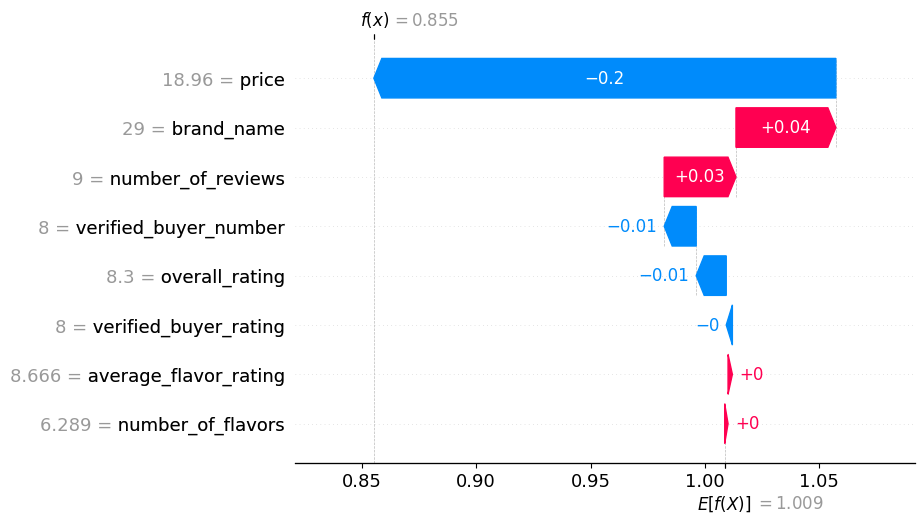

In [52]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

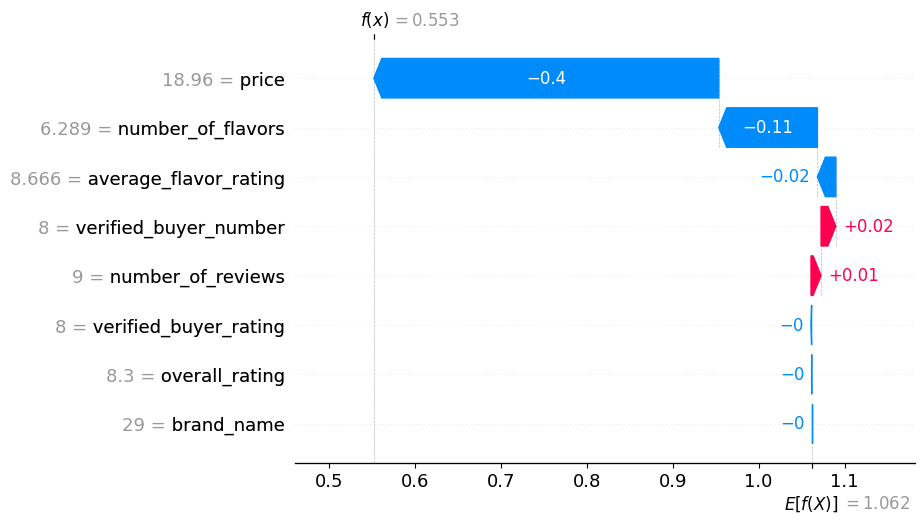

In [53]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

#Interpret the summary plot for the Linear and Tree-based model
Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent. 

1. Each dot(both red and blue) represents a feature of a supplement
2. Red color represents high values whereas blue color represents low value
3. If a dot(a feature of supplement) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
4. The position of a dot(a feature of supplement) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

*   Higher the price tends to have a positive impact on the price per serving of supplement
*   Lower values of number_of_reviews tend to have a positive impact on the price per serving of supplement.
*  Higher values of verified_buyer_number tends to have a positive impact on price per serving of supplement , and so on.



This visualization is very useful when it comes to interpreting how our model is working.  

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


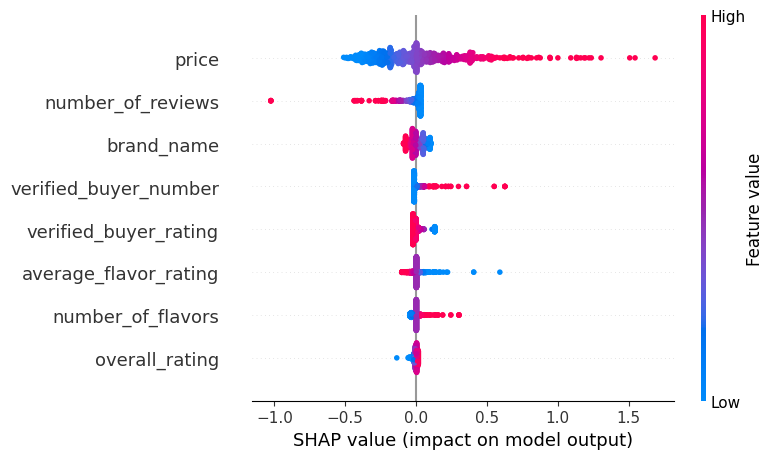

In [54]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

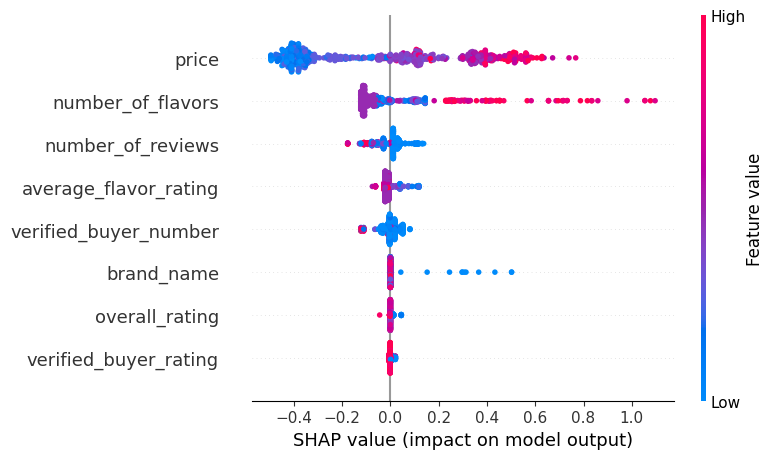

In [55]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

#Interpreting SHAP dependence plot for Linear and Tree-based model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every price per serving in our dataset. 

# **Linear Models**
* In linear models, the SHAP values for each feature are additive. This means that the SHAP value for a particular feature represents the contribution of that feature alone, while holding all other features constant.

* The SHAP dependence plot for linear models typically shows a straight line, which represents the linear relationship between the feature and the model's output. The slope of the line indicates the strength and direction of the relationship.

* If the line is horizontal, it means that the feature has little to no effect on the model's output. If the line is positively sloped, it means that increasing the feature value will increase the model's output. If the line is negatively sloped, it means that increasing the feature value will decrease the model's output.

# **Tree-based Models**
* In tree-based models, the SHAP values for each feature are not additive. Instead, they represent the contribution of a particular feature value relative to the baseline value (often the mean prediction of the model).
* The SHAP dependence plot for tree-based models typically shows a series of lines or curves, with each line or curve corresponding to a different feature value range. The plot shows how the SHAP value changes as the feature value changes within each range.
* The shape of the lines or curves in the SHAP dependence plot can indicate the nature of the relationship between the feature and the model's output. For example, a curve that starts low, increases rapidly, and then flattens out may indicate a nonlinear relationship between the feature and the model's output. A vertical line may indicate that the model is using a threshold to make a decision based on that feature.

**Example of SHAP dependence plot of Price per serving**


1.   In the linear model the relationship is linear between price per serving and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional. 
2.   In the tree-based model we could extract the information on how the price per serving is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The price per serving in the range (20 - 60) changes drastically. 








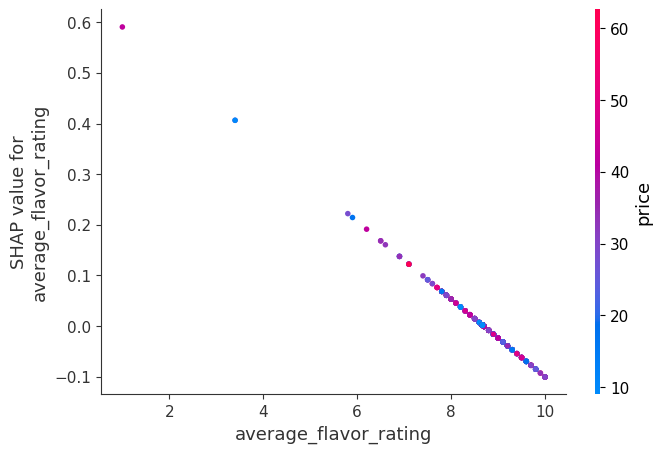

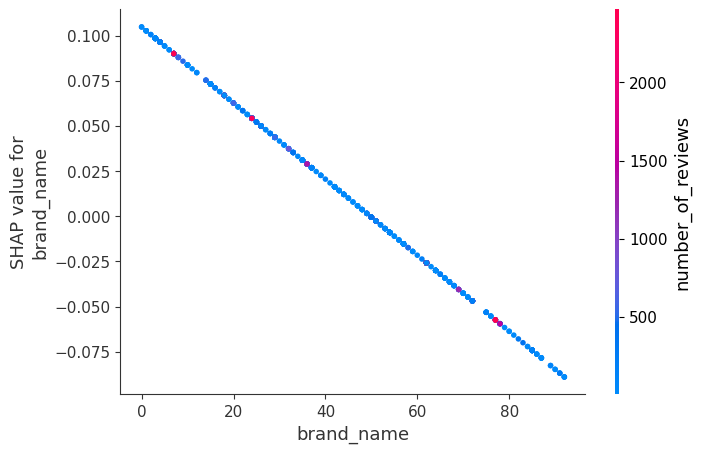

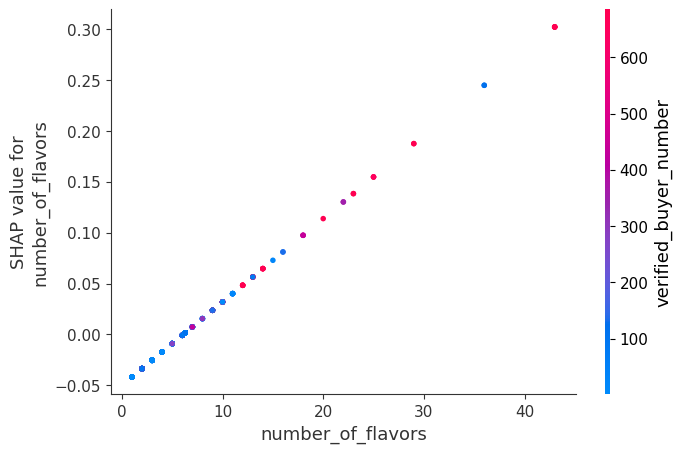

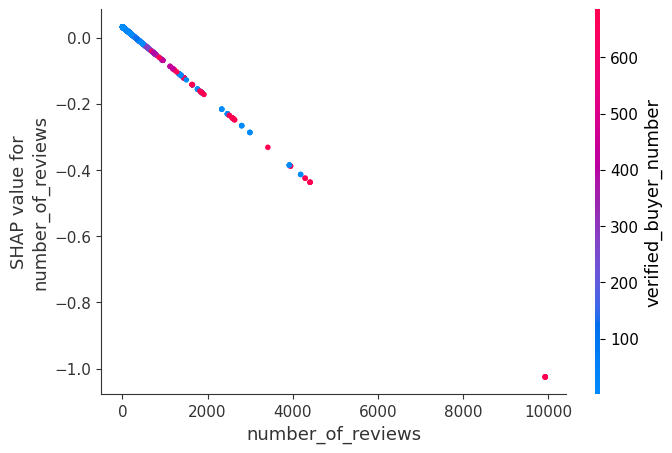

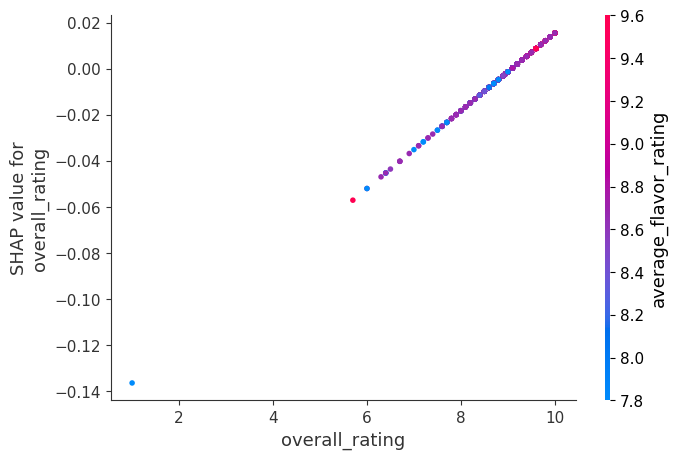

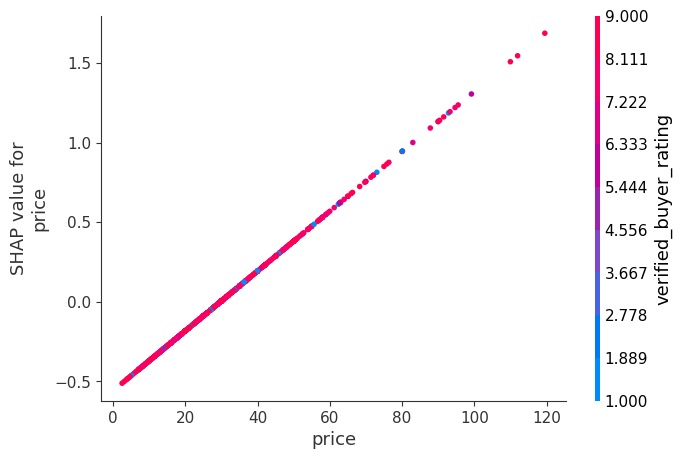

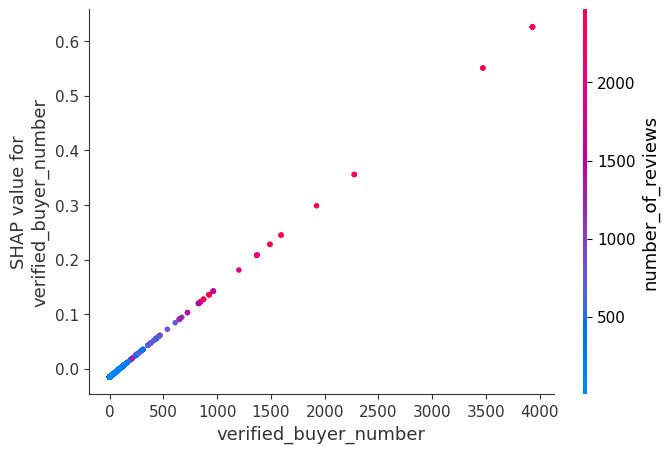

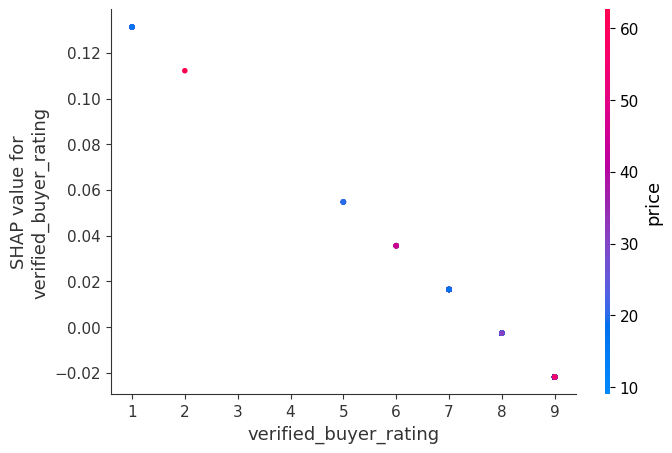

In [56]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

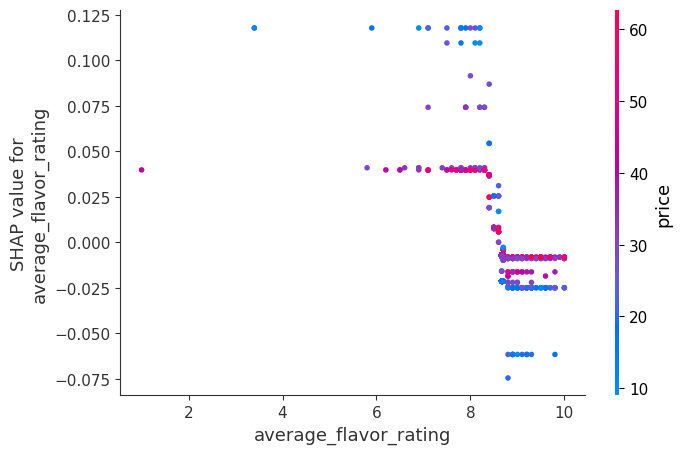

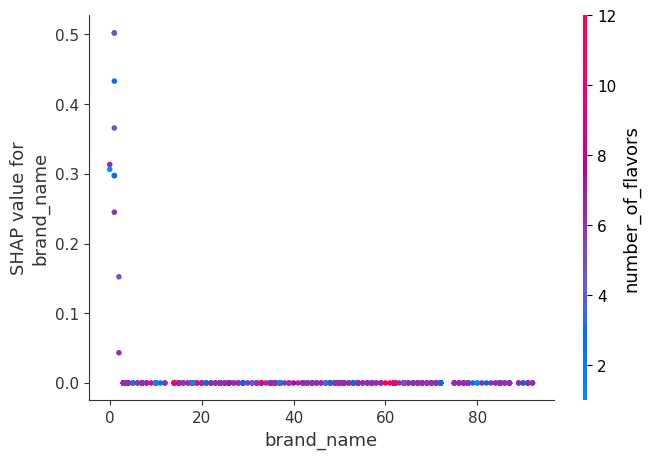

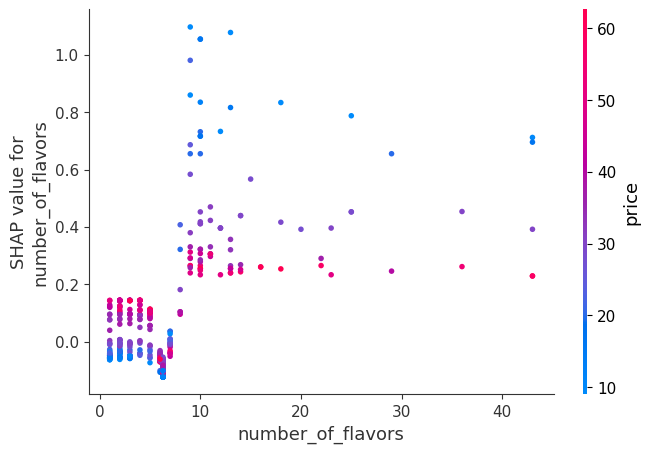

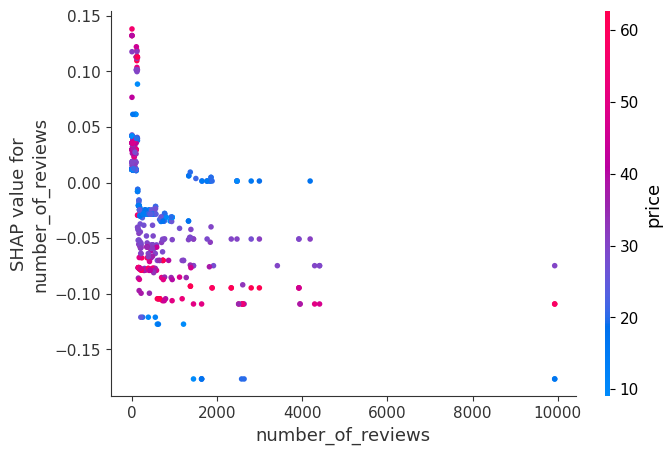

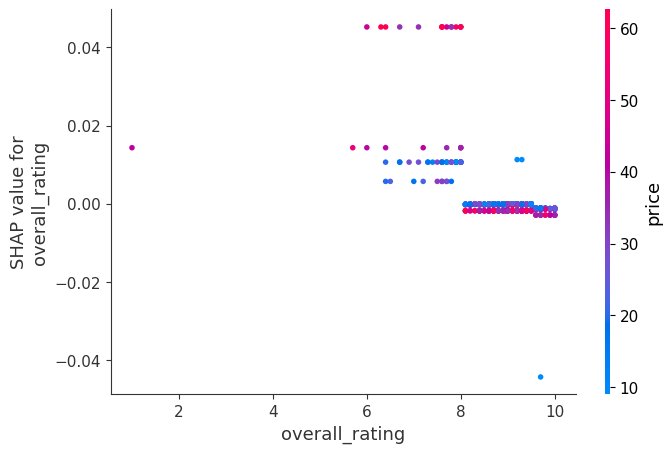

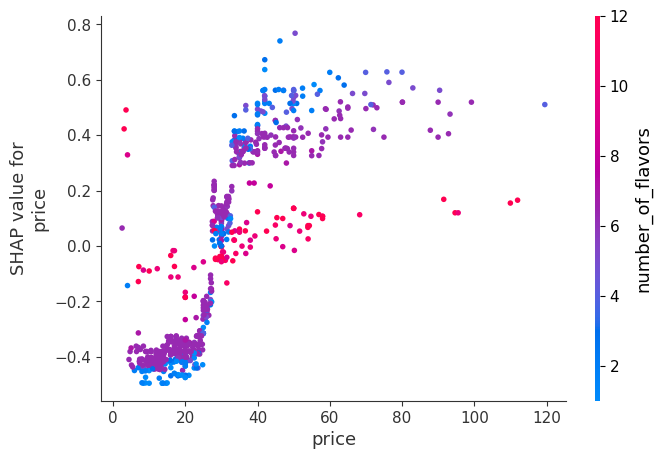

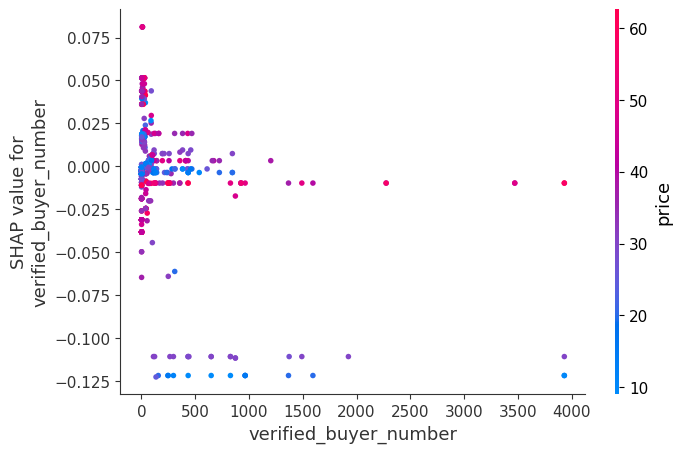

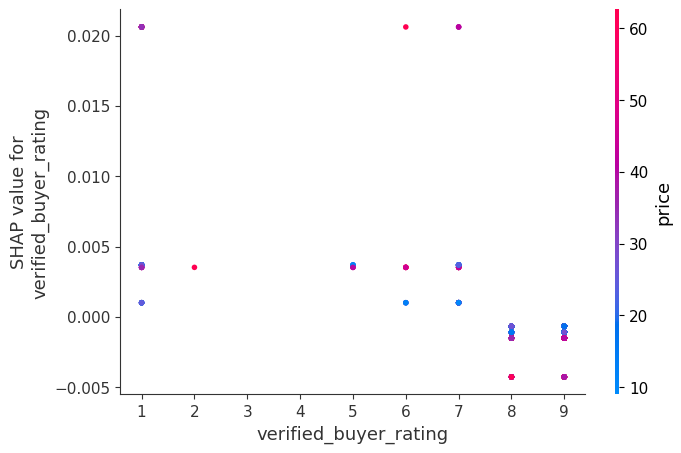

In [57]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [58]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

#Force Plot SHAP analysis
This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read

Let us consider one sample from the test set, Please refer to the Force Plot below 
- The output of the model is 0.55
- The features which had a significant positive impact on price per serving were price and number of flavors with 18.96 and 6.289 respectively
- The features which had a significant negative impact on price per serving were number_of_reviews, verified_buyer_number with 9 and 8 respectively

It gives us the same information which the waterfall model has to give

In [59]:

# Initializing JavaScript module
shap.initjs()  
# print(shap_plot_tree(18))  # SHAP force plot for sample 18

# Compute SHAP values for your data
explainer = shap.Explainer(tree_model)
shap_values = explainer(x_train)

# Generate the SHAP force plot for a specific sample
shap.force_plot(shap_values[18], x_train.iloc[18])

#Heatmap Visualization for Linear and Tree-based model

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(price per serving). 
- Here the Y-axis is Features
- and X-axis is Instance of that feature
- The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
- The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

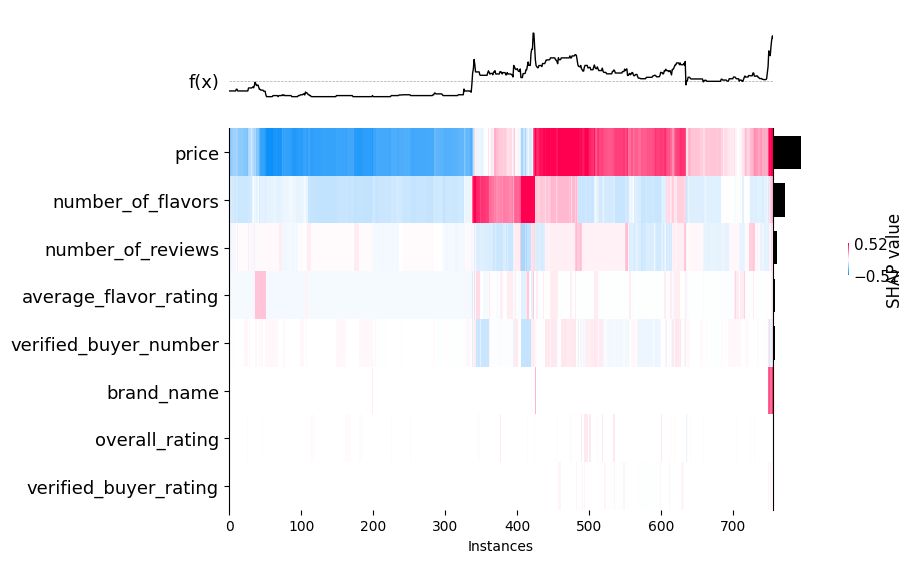

In [60]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

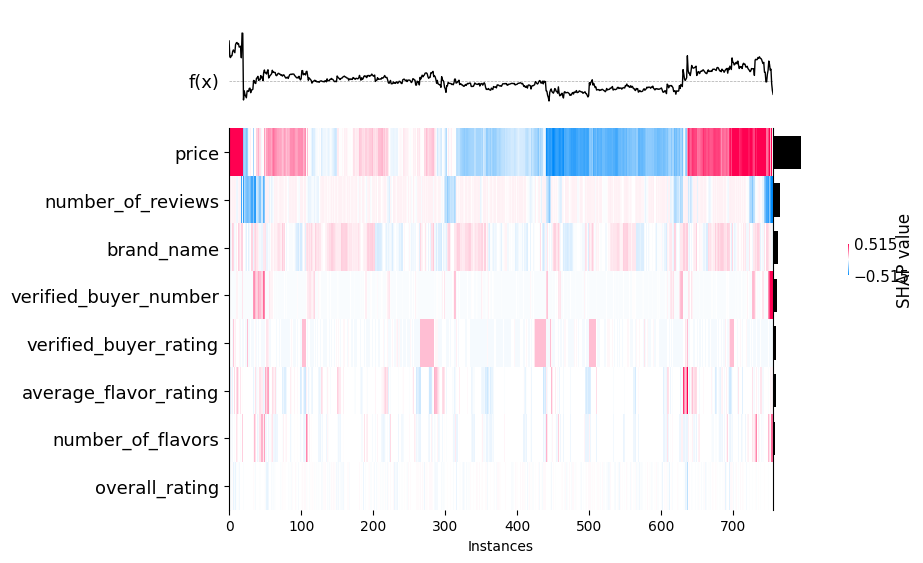

In [61]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

## LIME (Local Interpretation Model-Agnostic Explanation) Analysis

- LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

- LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models
- As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
- Here for this sample as seen below price, average_flavor_rating, verified_buyer_rating harmed both linear and tree-based model
- brand_name, verified_buyer_rating, overall_rating, had a positive effect on the price per serving in both models
- verified_buyer_number had a positive effect in the linear model but negative in tree-based model

These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

## Linear Model

In [62]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [63]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.58830592]
Actual :      1.6


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


In [64]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

## Tree Based Model

In [65]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [66]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Prediction :  [0.51602943]
Actual :      1.6


X does not have valid feature names, but RandomForestRegressor was fitted with feature names


In [67]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

#PDP(Partial Dependence Plot) for Linear model and Tree-based Model
1.   **Linear Model** - 
If we closely look at the PDP of the linear model we can see that if features price, verfified_buyer_number, Verified_buyer_rating are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(Price per serving)

2.   **Tree-Based Model** -
On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly


In [68]:
!pip install --upgrade scikit-learn

from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [69]:
x_test

,average_flavor_rating,brand_name,number_of_flavors,number_of_reviews,overall_rating,price,verified_buyer_number,verified_buyer_rating
695,8.66615,54,6.288714,4.000000,8.300000,8.60,1.0,9.0
816,8.66615,24,6.288714,3.000000,8.300000,19.99,1.0,8.0
30,8.66615,7,6.288714,3920.000000,9.200000,29.58,1.0,9.0
599,8.66615,57,6.288714,9.000000,9.800000,34.64,1.0,5.0
96,8.60000,4,18.000000,596.000000,9.100000,46.95,434.0,9.0
...,...,...,...,...,...,...,...,...
835,8.66615,88,6.288714,483.512789,8.950914,43.00,1.0,1.0
33,8.66615,15,6.288714,35.000000,9.400000,14.99,1.0,9.0
31,8.40000,62,43.000000,9926.000000,9.300000,47.99,3932.0,9.0
673,10.00000,67,2.000000,2.000000,10.000000,41.99,2.0,1.0


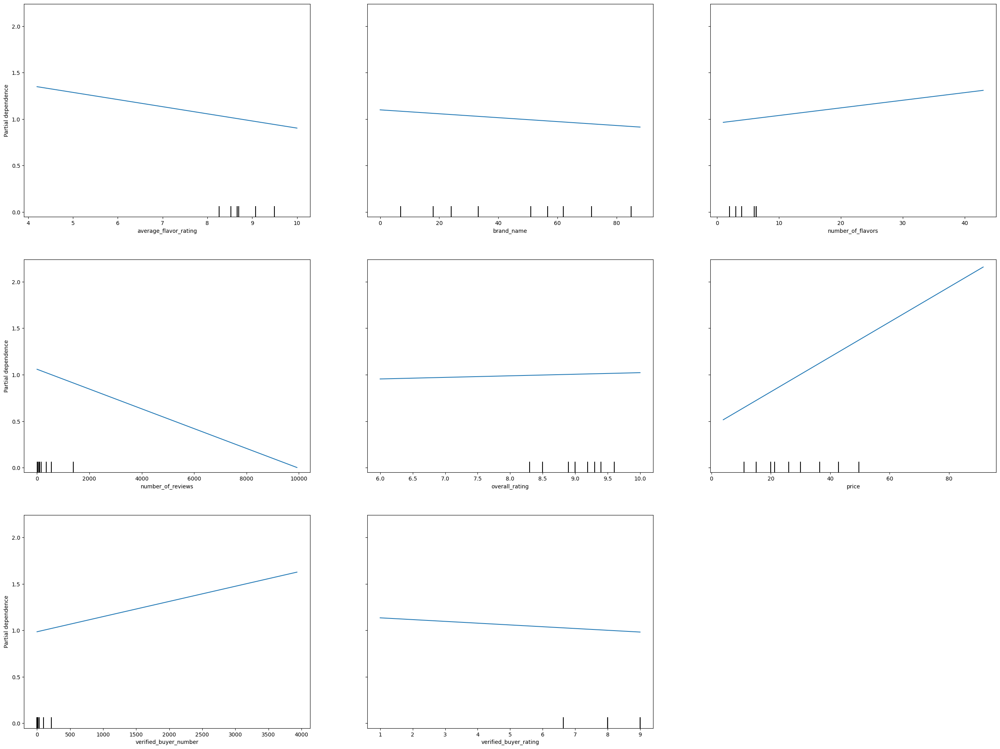

In [70]:
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns )

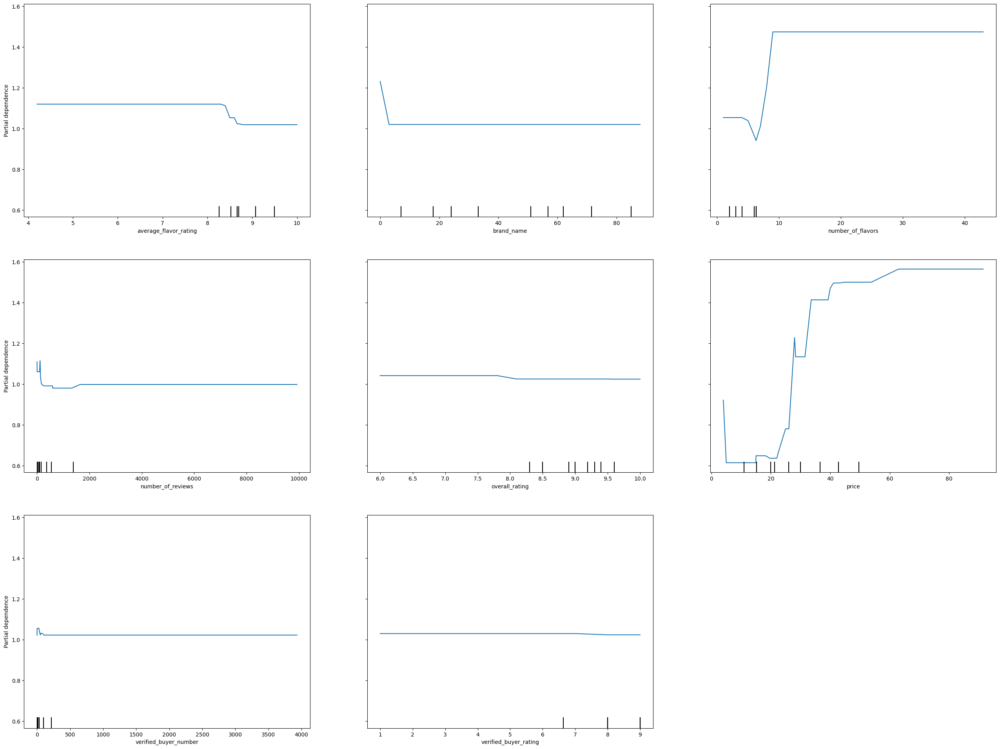

In [71]:
PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns )

# **CONCLUSION**
#Comparision between SHAP, LIME, and Partial Dependence Plot Analysis

* When it comes to interpreting machine learning models, there are different methods available like LIME, SHAP, and PDP. 

* SHAP (SHapley Additive exPlanations), LIME (Local Interpretable Model-agnostic Explanations), and Partial Dependence Plots (PDPs) are all popular methods for interpreting machine learning models. Here are some areas where they work well:

* SHAP: SHAP is a model-agnostic method that can be used with any machine learning model. It works well for complex models, such as gradient boosting machines and deep neural networks. SHAP provides global and local interpretability for models and can be used to identify important features in a model.

* LIME: LIME is also a model-agnostic method and works well for black-box models, where the underlying structure is unknown. It can be used for both classification and regression problems and provides local interpretability for models. LIME works well in areas such as healthcare, finance, and image recognition.

* Partial Dependence Plots: PDPs work well for understanding the relationship between the target variable and one or more predictor variables. They can be used with any machine learning model and provide a visual representation of the relationship between the target and predictor variables. PDPs are particularly useful in areas such as economics, where understanding the relationship between different variables is important.

* While LIME creates a local interpretable model and SHAP calculates the feature importance using the game theory concept of Shapley values, PDP freezes the rest of the variables to show the extent of the effect a variable has on the output. 
* SHAP is considered to be an improvement over LIME due to its greater stability and lack of local linear model assumptions. 
* However, selecting the best interpretable method for the ML model depends on the specific needs of the analysis and the trade-offs involved.


#References

* https://openai.com/blog/chatgpt
* https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb
* https://scikit-learn.org/stable/modules/generated/sklearn.inspection.PartialDependenceDisplay.html
* https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb
